# TPC-C Multi-Tenant with Distributed PVC and Tuned PostgreSQL 17.5

* data is generated and loaded into databases in a distributed filesystem
* experiments do not use preloaded data

* PostgreSQL uses improved args:
```
# --- Connection & Worker Processes ---
- "-c"
- "max_connections=1500"       # https://www.postgresql.org/docs/current/runtime-config-connection.html#GUC-MAX-CONNECTIONS
- "-c"
- "max_worker_processes=128"   # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-WORKER-PROCESSES
- "-c"
- "max_parallel_workers=64"    # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-PARALLEL-WORKERS
- "-c"
- "max_parallel_workers_per_gather=8"  # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-PARALLEL-WORKERS-PER-GATHER
- "-c"
- "max_parallel_maintenance_workers=8" # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-PARALLEL-MAINTENANCE-WORKERS

# --- Memory Settings ---
- "-c"
- "shared_buffers=256GB"       # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-SHARED-BUFFERS
- "-c"
- "effective_cache_size=350GB" # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-EFFECTIVE-CACHE-SIZE
- "-c"
- "work_mem=128MB"             # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-WORK-MEM
- "-c"
- "maintenance_work_mem=4GB"   # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAINTENANCE-WORK-MEM
- "-c"
- "temp_buffers=64MB"          # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-TEMP-BUFFERS
- "-c"
- "wal_buffers=16MB"           # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-BUFFERS
- "-c"
- "autovacuum_work_mem=1GB"    # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-WORK-MEM

# --- Autovacuum ---
- "-c"
- "autovacuum=off"                          # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM
- "-c"
- "autovacuum_max_workers=10"               # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-MAX-WORKERS
- "-c"
- "autovacuum_vacuum_cost_limit=1000"       # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-VACUUM-COST-LIMIT
- "-c"
- "vacuum_cost_limit=1000"                  # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-VACUUM-COST-LIMIT
- "-c"
- "autovacuum_naptime=15s"                  # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-NAPTIME
- "-c"
- "autovacuum_vacuum_cost_delay=20ms"       # https://www.postgresql.org/docs/current/runtime-config-autovacuum.html#GUC-AUTOVACUUM-VACUUM-COST-DELAY

# --- WAL & Checkpoints (Ceph-optimized) ---
- "-c"
#- "wal_level=replica"                       # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-LEVEL
- "wal_level=minimal"                       # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-LEVEL
- "-c"
- "max_wal_senders=0"                       # https://www.postgresql.org/docs/current/runtime-config-replication.html#GUC-MAX-WAL-SENDERS
- "-c"
- "fsync=off"                               # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-FSYNC
- "-c"
- "wal_compression=on"                      # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-COMPRESSION
- "-c"
- "wal_writer_delay=500ms"                  # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-WAL-WRITER-DELAY
- "-c"
- "commit_delay=10000"                      # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-COMMIT-DELAY
- "-c"
- "synchronous_commit=off"                  # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-SYNCHRONOUS-COMMIT
- "-c"
- "max_wal_size=20GB"                       # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-MAX-WAL-SIZE
- "-c"
- "min_wal_size=10GB"                       # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-MIN-WAL-SIZE
- "-c"
- "checkpoint_timeout=5min"                 # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-CHECKPOINT-TIMEOUT
- "-c"
- "checkpoint_completion_target=0.9"        # https://www.postgresql.org/docs/current/runtime-config-wal.html#GUC-CHECKPOINT-COMPLETION-TARGET

# --- Planner Cost Tweaks (CephFS) ---
- "-c"
- "random_page_cost=4.0"                    # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-RANDOM-PAGE-COST
- "-c"
- "seq_page_cost=1.5"                       # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-SEQ-PAGE-COST
- "-c"
- "cpu_tuple_cost=0.01"                     # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-CPU-TUPLE-COST
- "-c"
- "effective_io_concurrency=2"              # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-EFFECTIVE-IO-CONCURRENCY
- "-c"
- "default_statistics_target=500"           # https://www.postgresql.org/docs/current/runtime-config-query.html#GUC-DEFAULT-STATISTICS-TARGET

# --- Locks and Limits ---
- "-c"
- "max_locks_per_transaction=128"           # https://www.postgresql.org/docs/current/runtime-config-locks.html#GUC-MAX-LOCKS-PER-TRANSACTION
- "-c"
- "max_pred_locks_per_transaction=128"      # https://www.postgresql.org/docs/current/runtime-config-locks.html#GUC-MAX-PRED-LOCKS-PER-TRANSACTION
- "-c"
- "max_stack_depth=7MB"                     # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-STACK-DEPTH
- "-c"
- "max_files_per_process=4000"              # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-MAX-FILES-PER-PROCESS

# --- Miscellaneous ---
- "-c"
- "huge_pages=try"                          # https://www.postgresql.org/docs/current/runtime-config-resource.html#GUC-HUGE-PAGES
```

In [1]:
import pandas as pd
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np

from bexhoma import collectors

%matplotlib inline

# Functions for Nice Plots

In [2]:
def sanitize_filename(title, max_length=100):
    # Replace non-alphanumeric characters with underscores
    safe = re.sub(r'[^a-zA-Z0-9-_]+', '_', title.strip())
    # Truncate to a safe length
    return safe[:max_length].rstrip('_')
    
def plot_bars(df, y, title, estimator):
    df_plot = df.copy()
    #df_plot = df_plot[df_plot['client']=='1']
    df_plot = df_plot.sort_values(['num_tenants','type'])
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    # Create the plot
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=df_plot,
        x='num_tenants',
        y=y,
        hue='type',
        estimator=estimator,
        palette='Set2',
        hue_order=hue_order
    )
    show_height = False
    if show_height:
        for bar in ax.patches:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,  # X: center of bar
                    height,                             # Y: top of bar
                    f'{height:.1f}',                    # Text (1 decimal place)
                    ha='center', va='bottom', fontsize=8
                )
    # Get tick positions (i.e., the x-axis categories)
    xticks = ax.get_xticks()
    bar_width = ax.patches[0].get_width()
    # Create a mapping from (num_tenants, type) to hatch
    grouped = df_plot.groupby(['num_tenants', 'type']).agg({y: estimator}).reset_index()
    #print(grouped)
    grouped_dict = {(row['num_tenants'], row['type']): hatch_map[row['type']] for _, row in grouped.iterrows()}
    bars = sorted(ax.patches, key=lambda bar: bar.get_x() if bar.get_height() > 0 else 10000)
    for bar, (_, row) in zip(bars, grouped.iterrows()):
        bar.my_id = (row['num_tenants'], row['type'])  # or anything else like an index or uuid
        bar.set_hatch(hatch_map[row['type']]) #grouped_dict[(bar.my_id)])
        bar.set_edgecolor('black')
        bar.set_linewidth(1)
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
    # Final touches
    plt.legend(title='Type')
    ax.legend(fontsize=18)
    #ax.legend(fontsize=18, loc='upper left', bbox_to_anchor=(1, 1))  # move outside
    plt.title(f"{title}", fontsize=24)
    #plt.title(f"{title} by Number of Tenants and Type", fontsize=24)
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    # Remove y-axis label
    ax.set_ylabel('')  # or ax.set(ylabel='')
    plt.tight_layout()
    if b_plot_save:
        filename = "tpcc_" + filename_prefix + sanitize_filename(title) + ".png"    
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

def plot_boxplots(df, y, title):
    plt.figure(figsize=(10, 6))
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot boxplots grouped by num_tenants and colored by type
    ax = sns.boxplot(
        data=df,
        x='num_tenants',
        y=y,#'Goodput (requests/second)',
        hue='type',
        palette='Set2'  # consistent colors per type
    )
    # Add vertical separator lines between groups
    # Get the number of unique num_tenants and type
    num_groups = df['num_tenants'].nunique()
    num_types = df['type'].nunique()
    
    # Extract hue order
    hue_order = ax.get_legend_handles_labels()[1]
    num_hue = len(hue_order)
    
    # Get hue order from seaborn (types)
    _, type_order = ax.get_legend_handles_labels()
    num_types = len(type_order)
    
    #print(len(ax.patches))
    # Set hatches correctly: patches are grouped by x then by hue
    for i, patch in enumerate(ax.patches):
        #print(i)
        type_index = i // (num_groups)
        if type_index >= num_types:
            break
        type_name = type_order[type_index]
        patch.set_hatch(hatch_map.get(type_name, ''))
        #print(hatch_map.get(type_name, ''))
        patch.set_edgecolor('black')
        patch.set_linewidth(1)
    
    # Each num_tenants group has num_types boxes
    for i in range(1, num_groups):
        xpos = i - 0.5 #0.5
        ax.axvline(x=xpos, color='gray', linestyle='--', alpha=0.5)
    
    
    # Update legend with matching hatches
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
        handle.set_edgecolor('black')
        handle.set_linewidth(1)
    
    #title = "Goodput [req/s] Distribution per Tenant"
    plt.title(title, fontsize=24)
    plt.xlabel("Number of Tenants")
    plt.ylabel("")#"Goodput (requests/second)")
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    plt.legend(title="Type")
    ax.legend(fontsize=18)
    plt.tight_layout()
    if b_plot_save:
        filename = "tpcc_" + filename_prefix + sanitize_filename(title) + ".png"    
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

def plot_lines(df, y, title):
    plt.figure(figsize=(10, 6))

    # Consistent colors per type
    palette = {
        'container': '#66c2a5',
        'database': '#fc8d62',
        'schema': '#8da0cb'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot lineplot grouped by num_tenants and colored by type

    ax = sns.lineplot(
        data=df.reset_index(),
        x="timestamp",
        y=y,
        hue="type",
        hue_order=hue_order,
        style="num_tenants",          # different line styles per type
        markers=False,          # markers at points
        dashes=True,
        estimator=None,   # plot raw data without aggregation
        errorbar=None,
        #fill=False,         # <- this disables area fill!
        #ci=None,
        palette=palette
    )

    # Axis labels and title
    plt.title(title, fontsize=24)
    plt.xlabel("Second", fontsize=18)
    #plt.ylabel(y, fontsize=18)
    ax.set(ylabel=None)
    ax.tick_params(axis='both', labelsize=16)

    # Legend formatting
    plt.legend(fontsize=16, title_fontsize=18)
    
    # Save
    if b_plot_save:
        filename = "tpcc_" + filename_prefix + "_" + title.replace(" ", "_") + ".png"
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

#print("Seaborn version:", sns.__version__)

# Collect Results

In [3]:
path = r"C:\data\benchmarks"
#path = r"/home/perdelt/benchmarks"
filename_prefix = "cpupolicy_"
b_plot_save = False

In [4]:
codes = [
    "1755830083", # container 1
    "1755827075", # database 1
    "1755824080", # schema 1

    "1755839262", # container 2
    "1755836179", # database 2
    "1755833116", # schema 2

    "1755848595", # container 3
    "1755845535", # database 3
    "1755842485", # schema 3

    "1755858160", # container 4
    "1755855077", # database 4
    "1755852020", # schema 4

    "1755867979", # container 5
    "1755864901", # database 5
    "1755861821", # schema 5

    "1755878072", # container 6
    "1755874940", # database 6
    "1755871773", # schema 6

    "1755888550", # container 7
    "1755885371", # database 7
    "1755882168", # schema 7

    "1755793771", # container 8
    "1755790419", # database 8
    "1755786996", # schema 8

    "1755804876", # container 9
    "1755801655", # database 9
    "1755798460", # schema 9

    "1755816059", # container 10
    "1755820822", # database 10
    "1755809536", # schema 10
]

codes

['1755830083',
 '1755827075',
 '1755824080',
 '1755839262',
 '1755836179',
 '1755833116',
 '1755848595',
 '1755845535',
 '1755842485',
 '1755858160',
 '1755855077',
 '1755852020',
 '1755867979',
 '1755864901',
 '1755861821',
 '1755878072',
 '1755874940',
 '1755871773',
 '1755888550',
 '1755885371',
 '1755882168',
 '1755793771',
 '1755790419',
 '1755786996',
 '1755804876',
 '1755801655',
 '1755798460',
 '1755816059',
 '1755820822',
 '1755809536']

In [5]:
collect = collectors.benchbase(path, codes)

# Get all Metrics Metadata

In [6]:
code = codes[12]
evaluate = collect.get_evaluator(code)
collect.df_metrics = collect.get_metrics(evaluate)

collect.df_metrics

,title,active,type,metric
total_cpu_memory,Memory Usage [MiB],True,cluster,gauge
total_cpu_memory_cached,Memory Usage Cached [MiB],True,cluster,gauge
total_cpu_util,CPU Utilization [%],True,cluster,gauge
total_cpu_throttled,CPU Throttle [%],True,cluster,gauge
total_cpu_throttled_s,CPU Throttled Time [s],True,cluster,counter
total_cpu_util_others,CPU Utilization Others [%],False,cluster,gauge
total_cpu_util_s,CPU Utilization Time [s],True,cluster,counter
total_cpu_util_user_s,CPU User Time [s],True,cluster,counter
total_cpu_util_sys_s,CPU System Time [s],True,cluster,counter
total_cpu_util_others_s,CPU Utilization Time Others [s],False,cluster,counter


# Get Values Aggregated per SUT and per Experiment

In [7]:
df_performance = collect.get_monitoring_all(type="stream")
df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],11280.95,15781.55,11402.96,15934.91,11219.34,15876.78,20537.66,28889.83,14900.05,21057.89,...,36419.48,39824.57,36174.76,38795.28,80436.5,95477.51,39534.86,42776.77,39694.94,42223.93
Memory Usage Cached [MiB],22646.49,32937.14,23110.41,33764.31,22631.66,33526.33,37872.1,57264.48,30674.66,43448.79,...,67522.16,74289.11,67169.24,72463.81,115172.57,144217.08,71672.67,78398.59,71942.53,77382.29
CPU Utilization [%],23.55,17.25,23.22,17.58,23.21,18.18,36.63,31.16,27.51,19.94,...,31.39,14.59,29.91,13.71,52.98,54.18,31.74,14.89,30.96,13.45
CPU Throttle [%],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],29789.32,21791.4,28941.37,21634.3,28931.11,22085.45,45173.48,39559.75,33912.21,24955.08,...,39074.6,18011.12,37234.18,16954.57,65845.57,68545.31,38902.47,18891.8,37885.34,16330.24
CPU User Time [s],17952.8,12155.61,17661.82,11848.33,17888.8,12531.03,29177.77,23404.28,21871.81,15296.96,...,24884.74,11149.08,23393.68,10403.85,44532.69,46598.06,24612.08,11421.95,25316.94,10096.68
CPU System Time [s],11836.52,9635.79,11279.54,9785.97,11042.31,9554.42,15995.71,16155.46,12040.4,9658.12,...,14189.86,6862.03,13840.5,6550.73,21312.89,21947.25,14290.39,7469.85,12568.41,6233.56
Core Utilization Variance [%],17.64,10.97,17.04,11.93,17.24,12.23,74.56,52.85,24.07,14.0,...,32.27,9.25,30.21,8.01,769.03,783.7,32.56,9.86,32.78,7.95


# Bar Plots of Aggregated Values per Metric

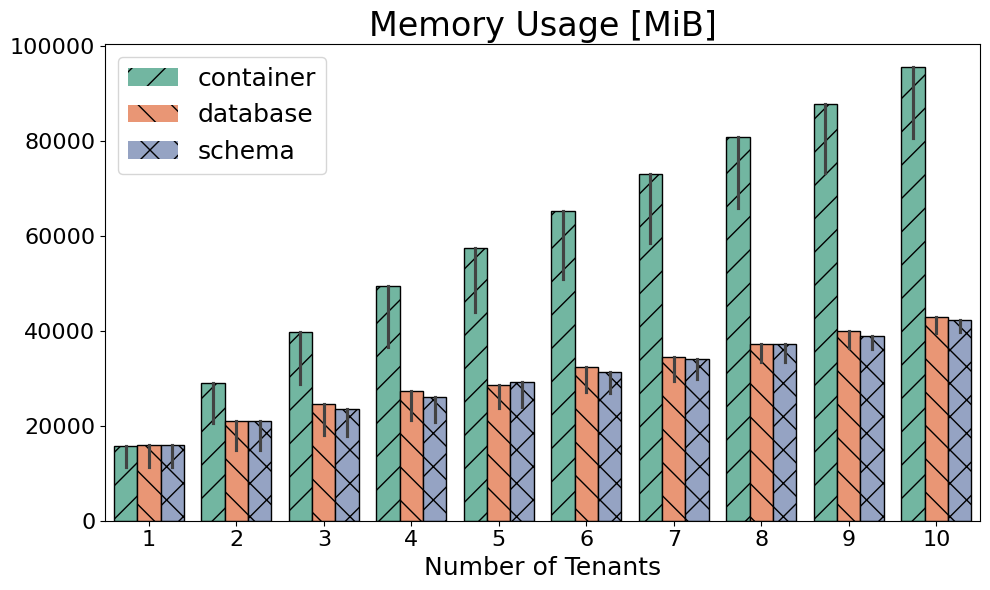

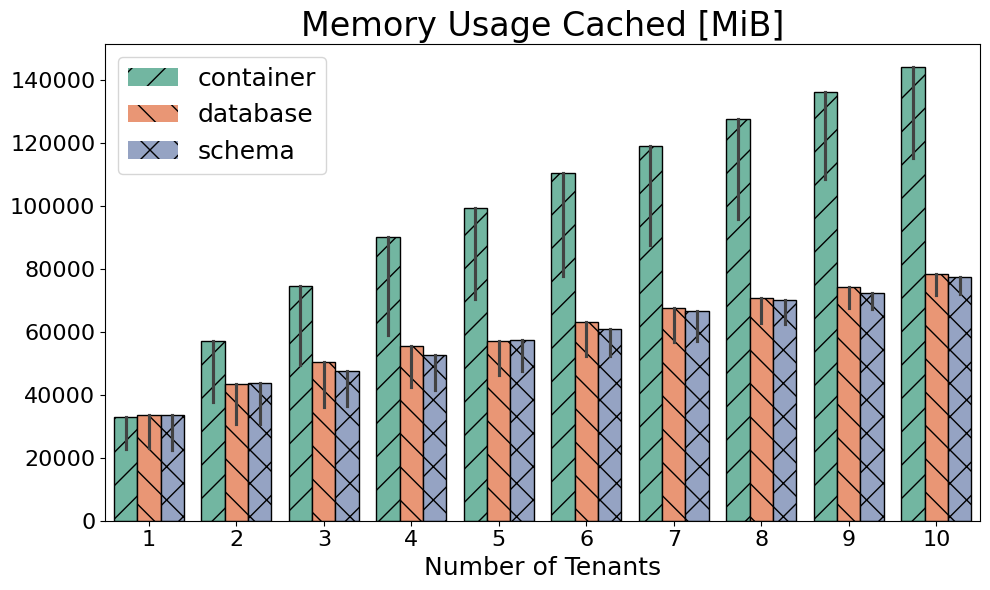

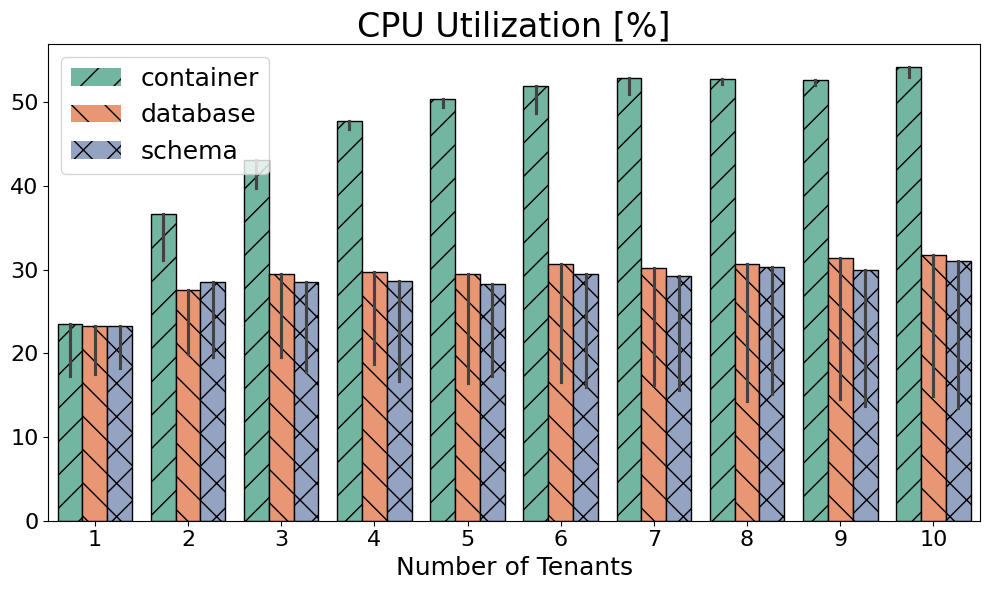

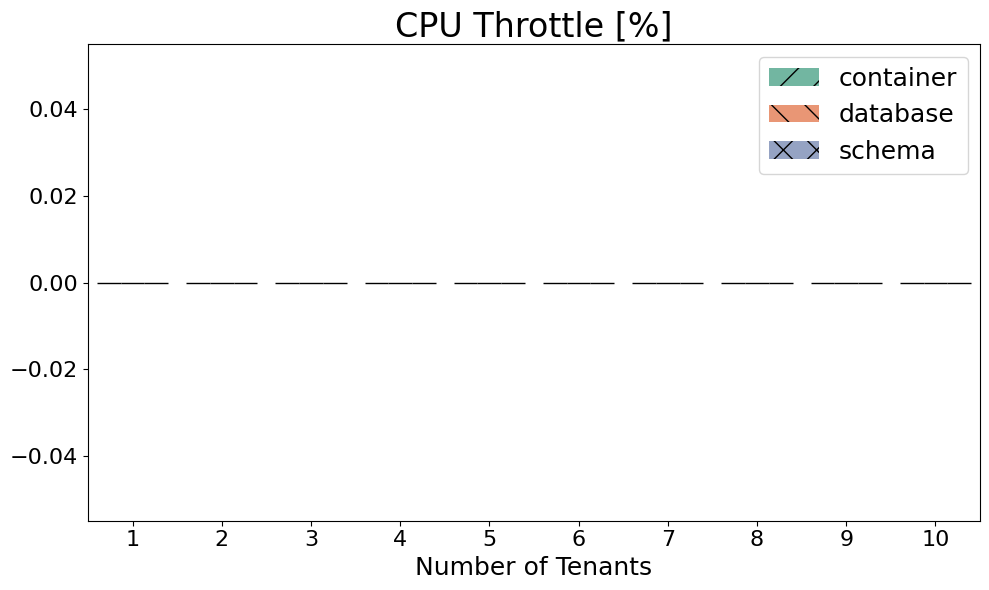

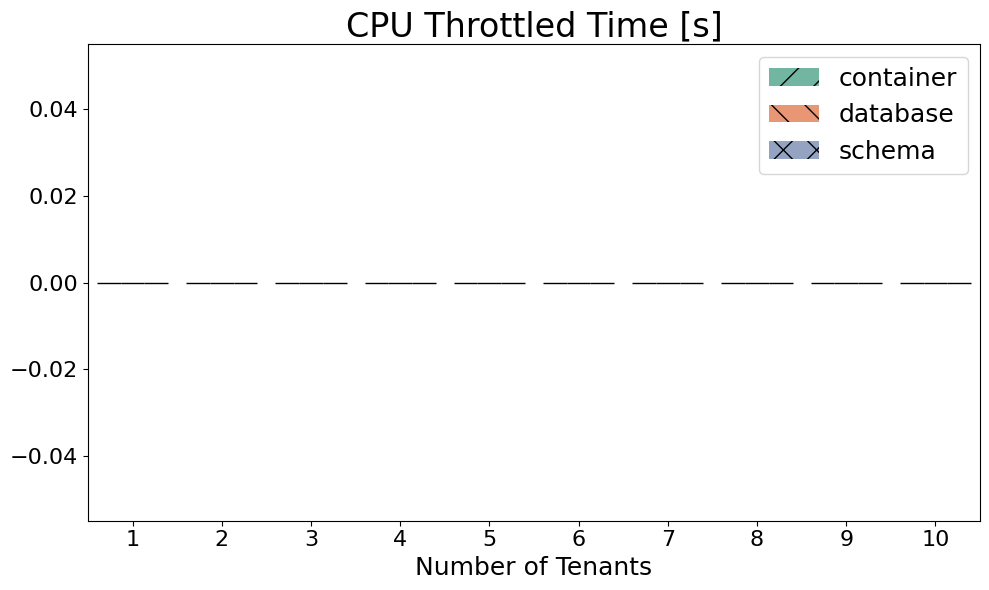

...

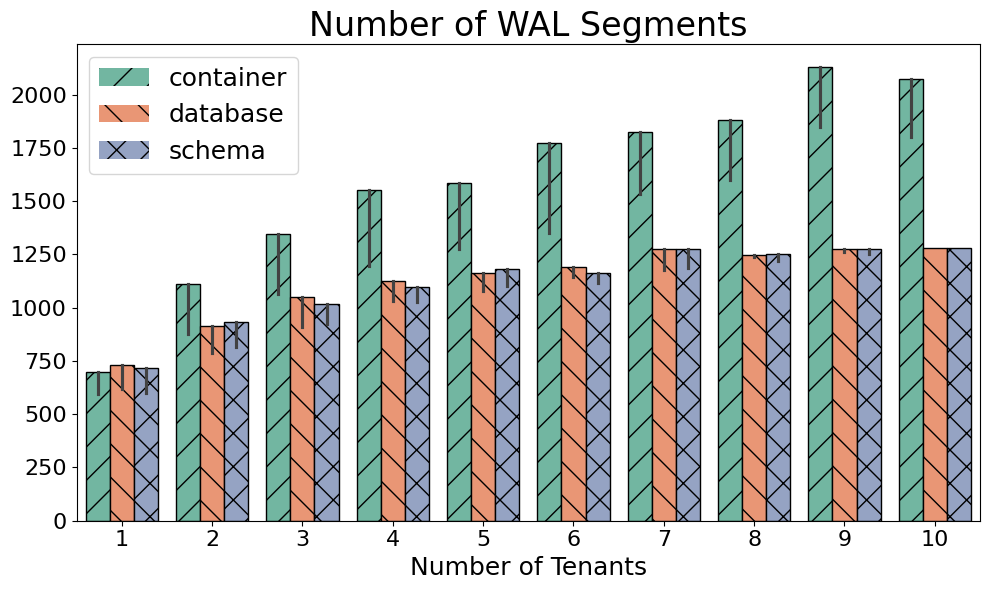

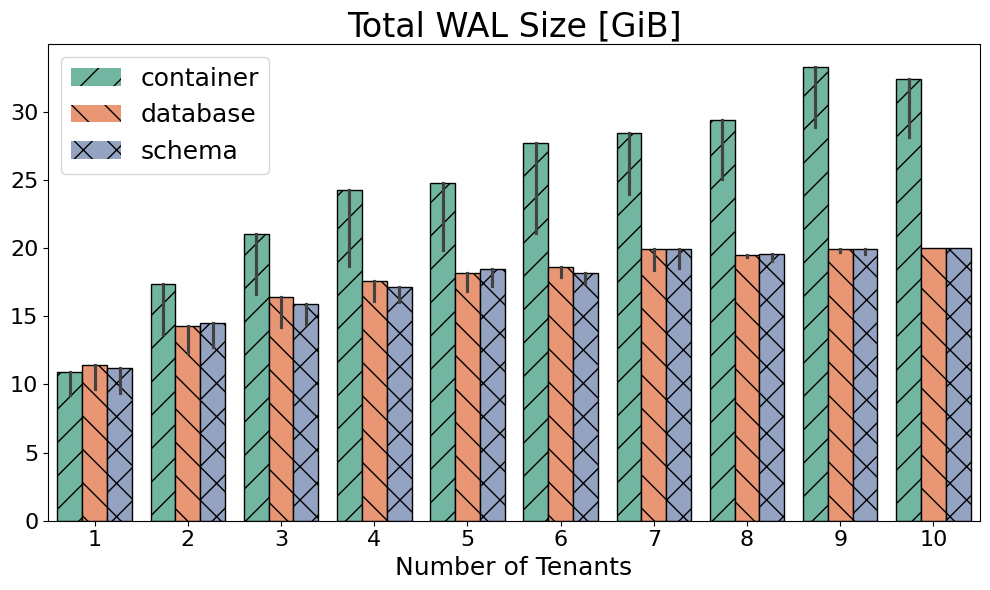

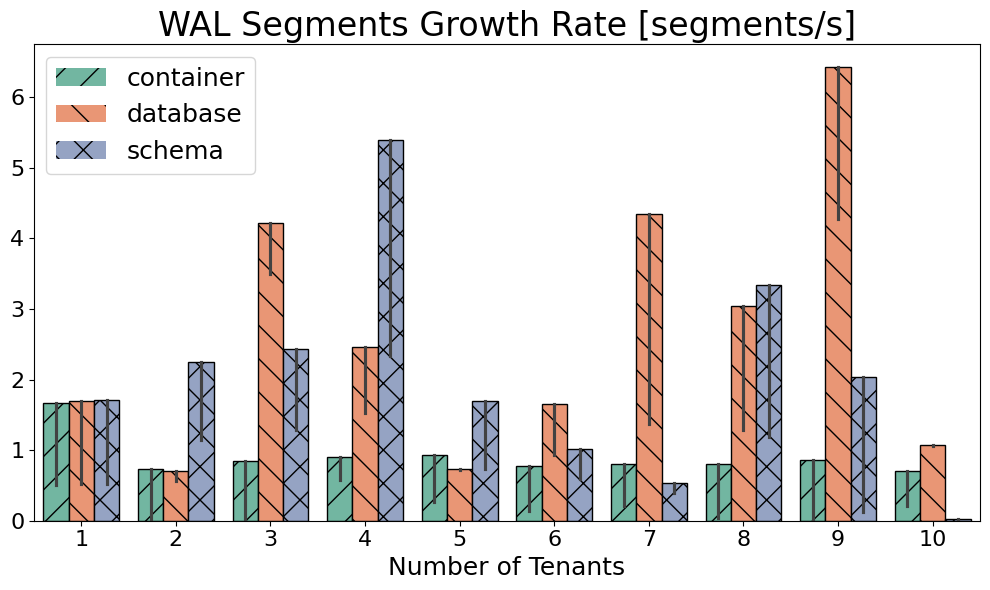

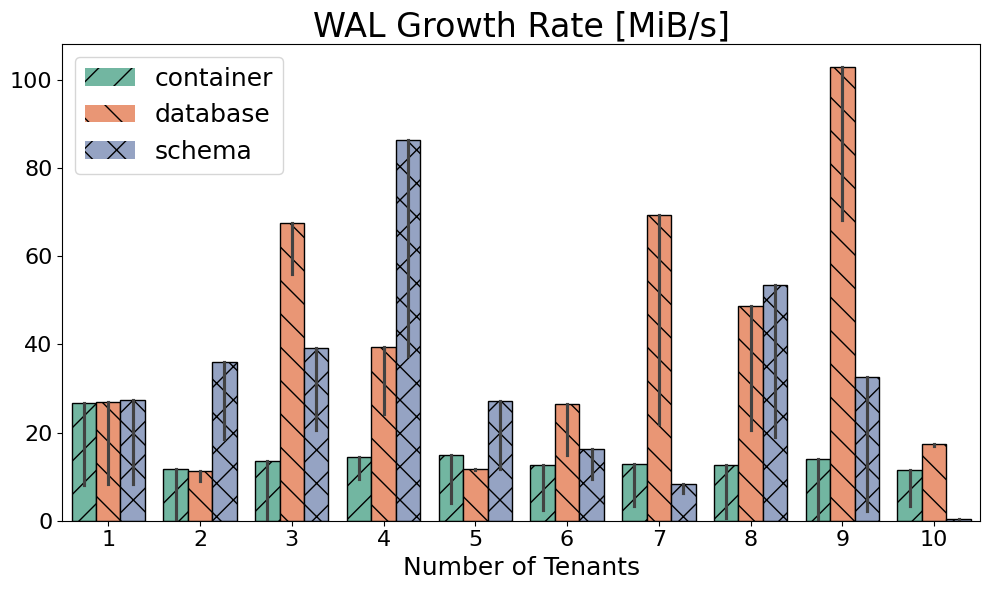

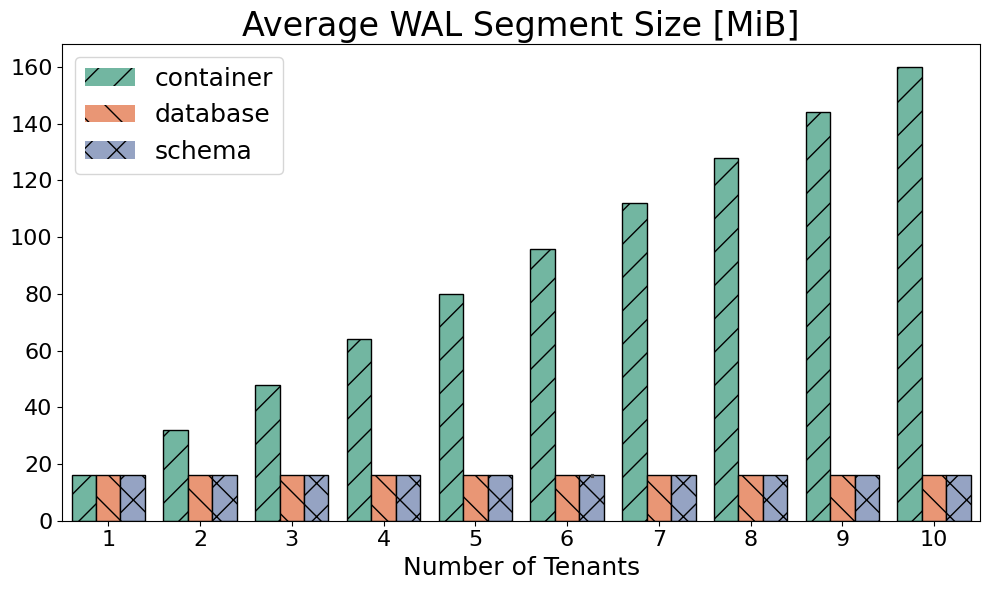

In [8]:
for idx, row in collect.df_metrics.iterrows():
    if row["active"] == False:
        continue
    col_name = row["title"]
    plot_bars(df_performance, y=col_name, title=col_name, estimator='max')

# Boxplot of All Metrics for a Single Experiment

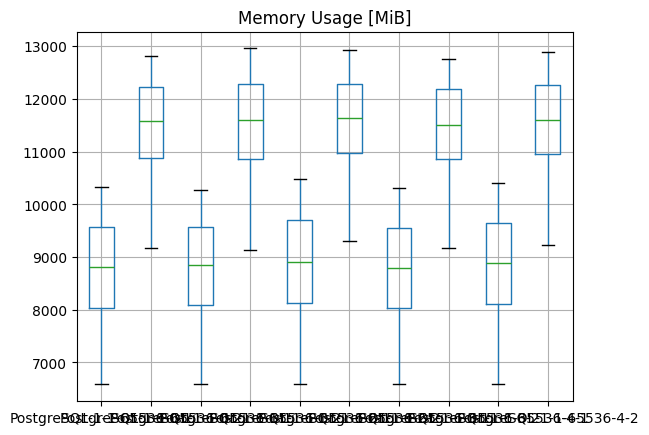

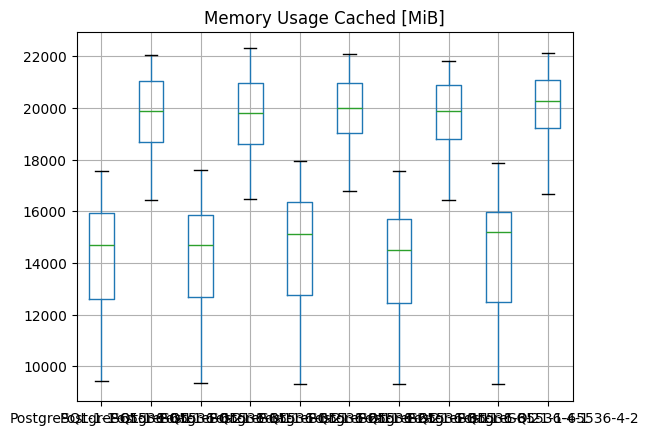

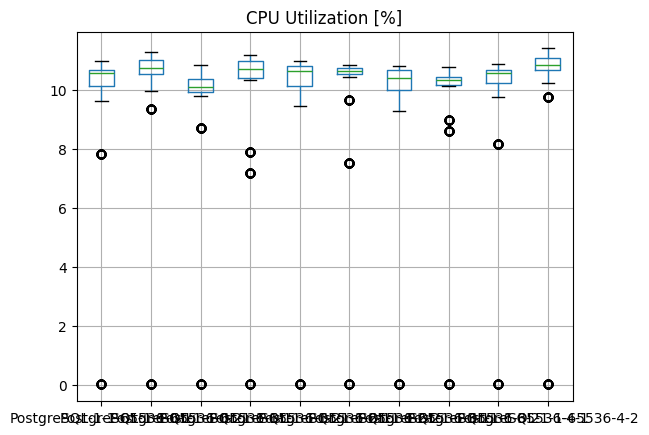

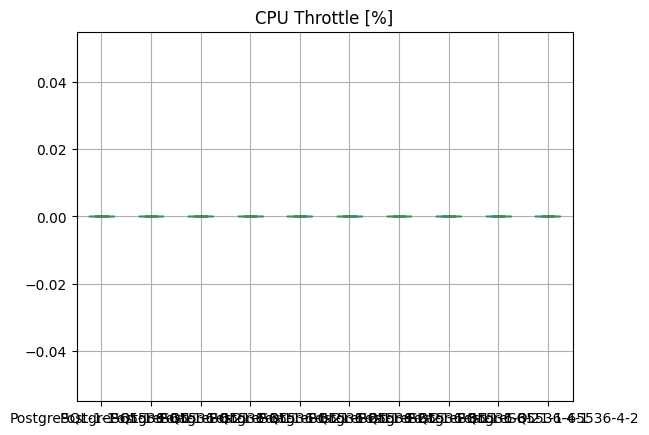

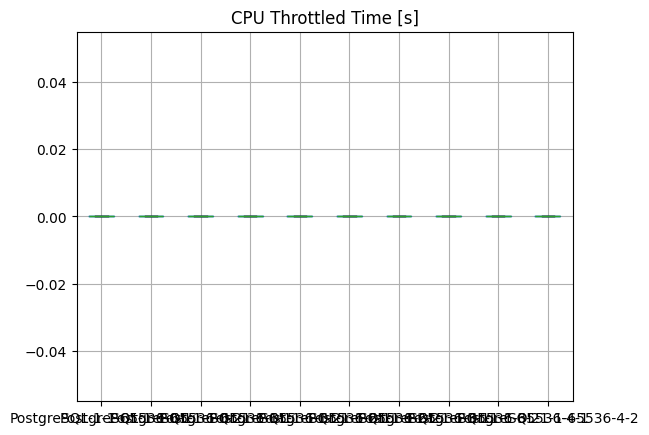

...

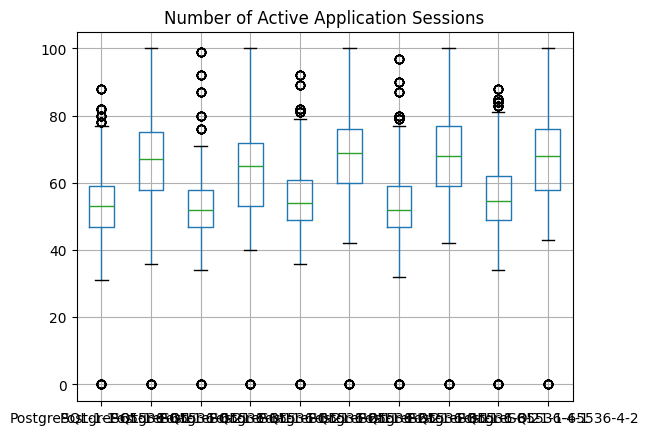

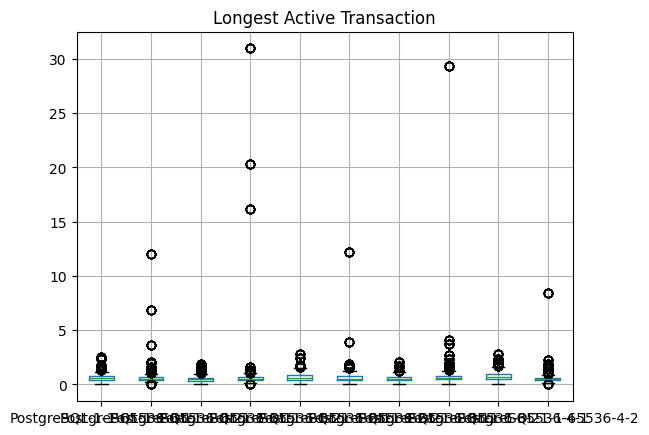

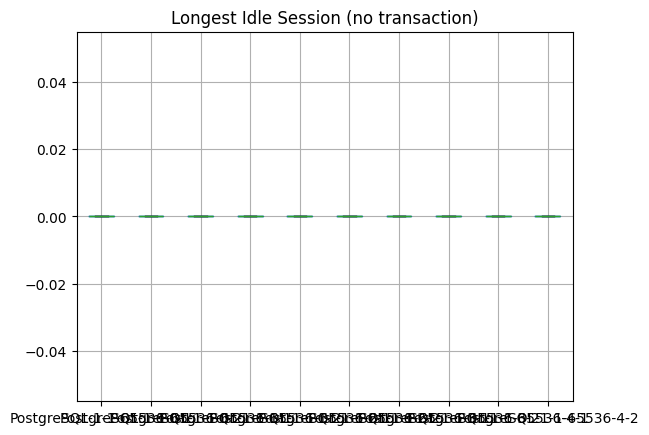

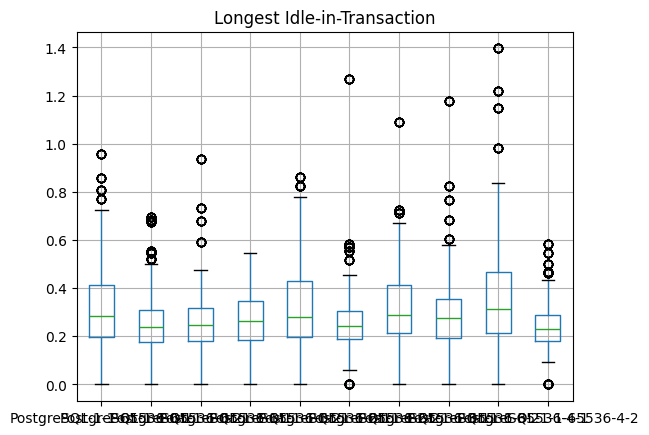

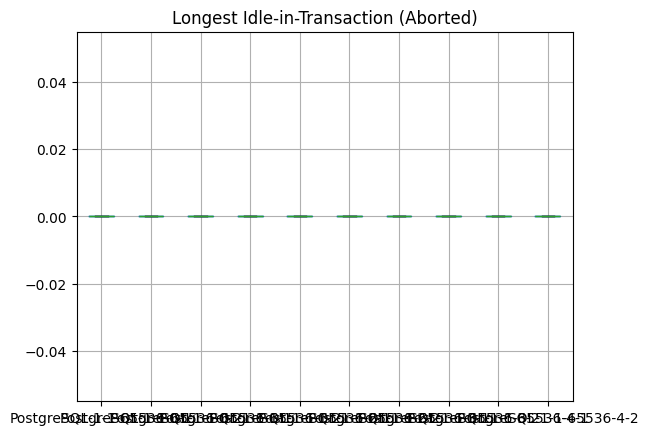

C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\numpy\lib\_function_base_impl.py:4720: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1320: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1327: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1335: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
C:\Users\Patrick\.conda\envs\dbmsbenchmarker\Lib\site-packages\matplotlib\cbook.py:1336: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


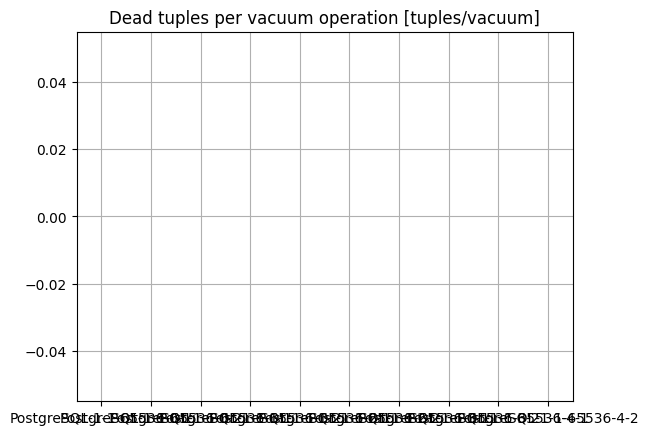

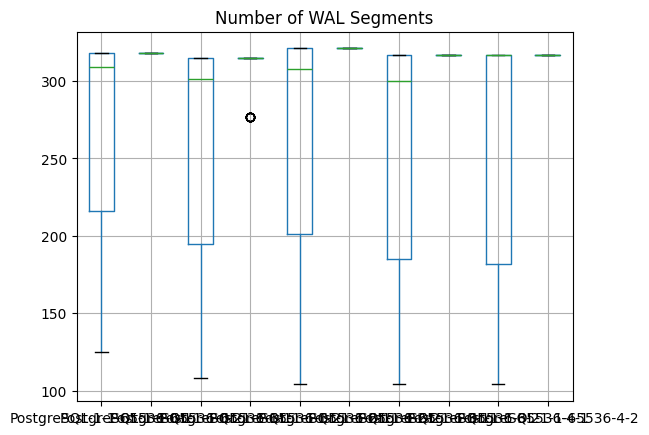

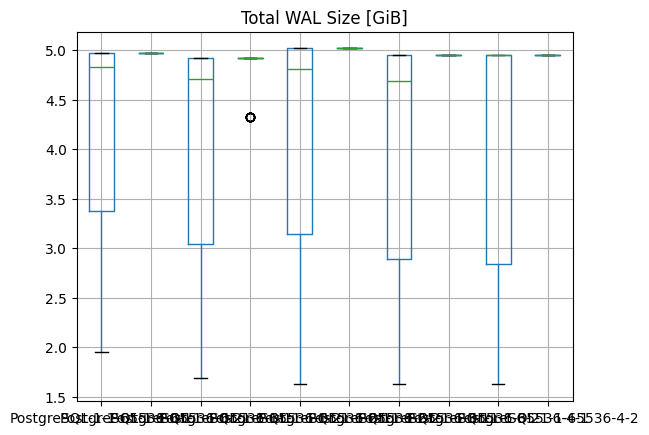

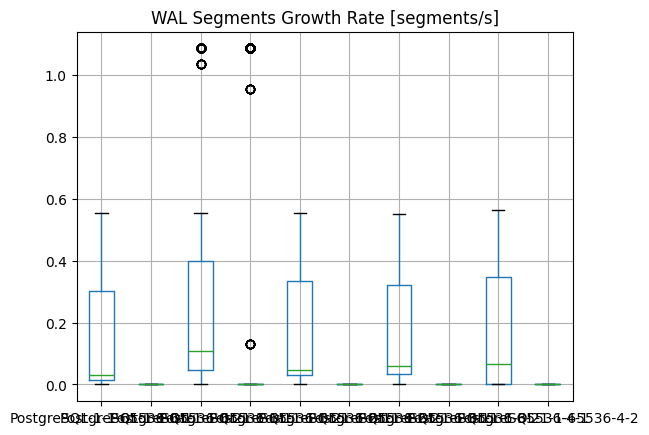

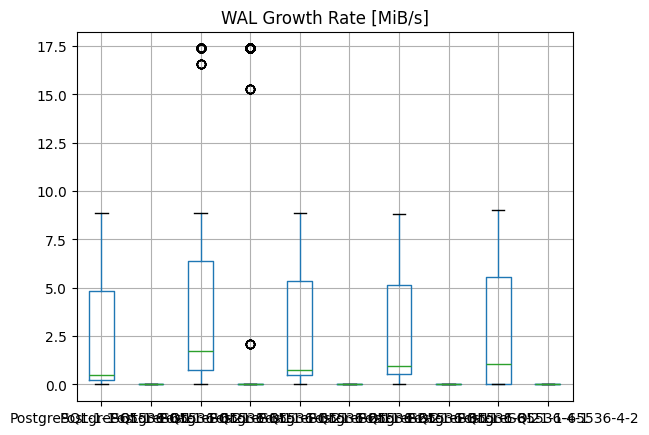

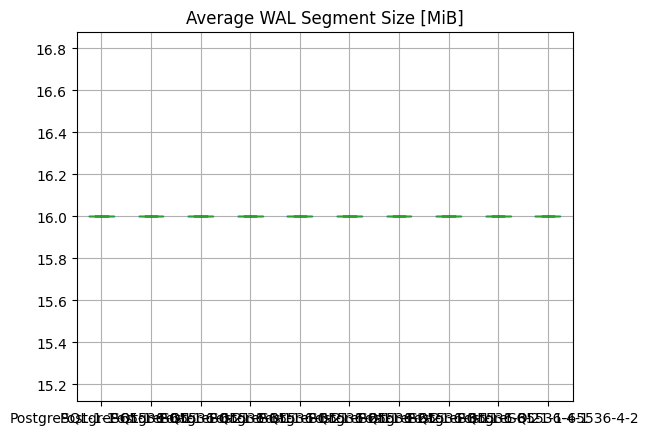

In [9]:
results = []
code = codes[12]
for idx, row in collect.df_metrics.iterrows():
    if row["active"] == False:
        continue
    #print(idx, row["title"])
    metric_name = idx
    method = 'diff' if row["metric"] == 'counter' else 'mean'
    col_name = row["title"]
    df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric_name)
    #print(df_monitoring)
    #plot_boxplots(df_monitoring, y=metric_name, title=col_name)
    ax = df_monitoring.boxplot()
    ax.set_title(col_name)
    plt.show()
    #plot_boxplots(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

# Boxplot of A Single Metric for a Single Experiment

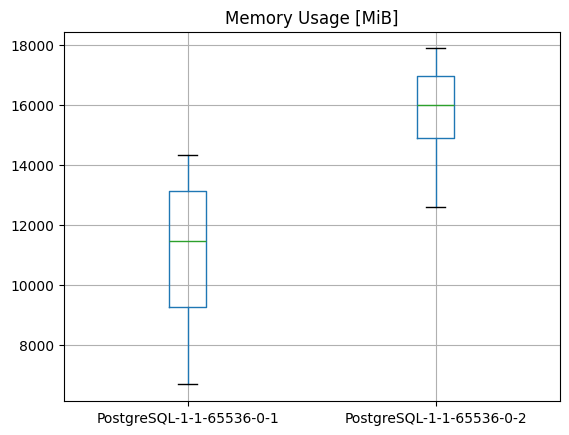

In [10]:
metric = 'pg_stat_activity_max_tx_duration_active'
#metric = 'pg_stat_database_blks_reads'
#metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
code = codes[0]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
#df_monitoring.boxplot()
ax = df_monitoring.boxplot()
ax.set_title(collect.df_metrics.loc[metric]['title'])#metric)
plt.show()

# Lineplot of a Single Metric for a Single Experiment

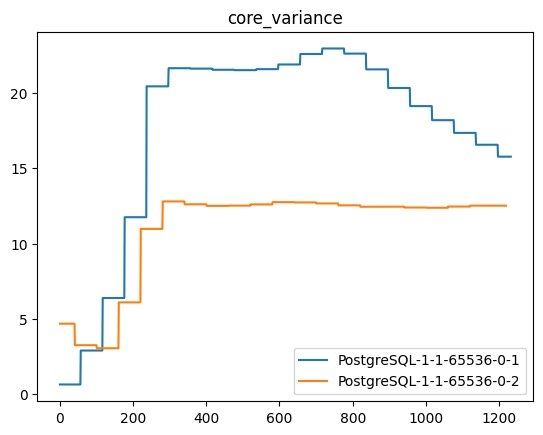

In [11]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'

code = codes[0]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
ax = df_monitoring.plot()
ax.set_title(metric)
plt.show()
#df_monitoring

# Boxplot of a Single Metric for all Experiments

In [12]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'
metric = 'pg_stat_activity_count_active'
#metric = 'pg_locks_count_exclusivelock'

df_performance = collect.get_monitoring_timeseries_all(metric)
#df_performance
df_performance_first = df_performance[df_performance['client']=="1"]
#df_performance_first
df_performance_second = df_performance[df_performance['client']=="2"]
#df_performance_second
#df_performance_first['value'].describe()

## First Execution Run

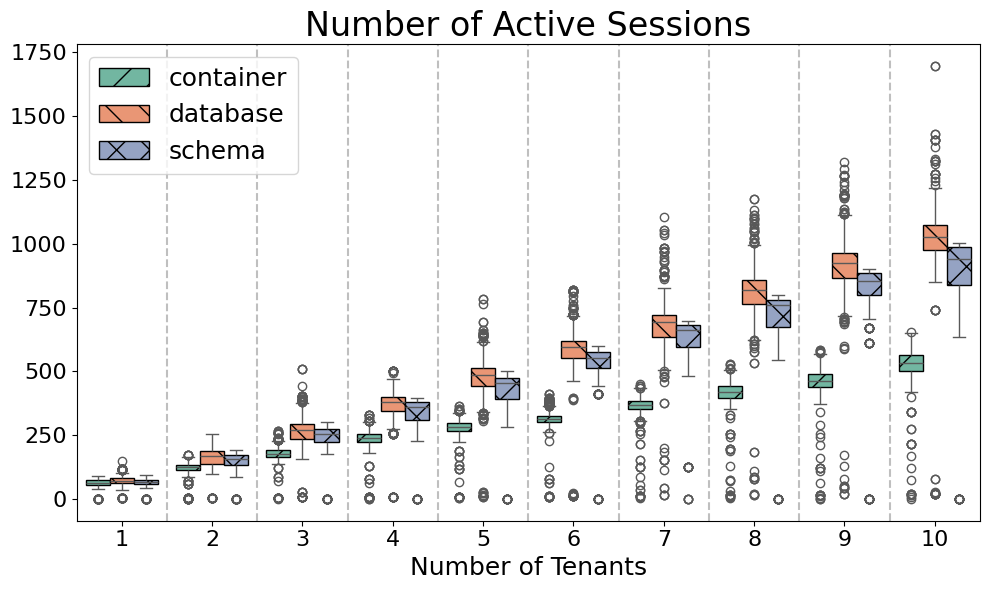

In [13]:
plot_boxplots(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

## Second Execution Run

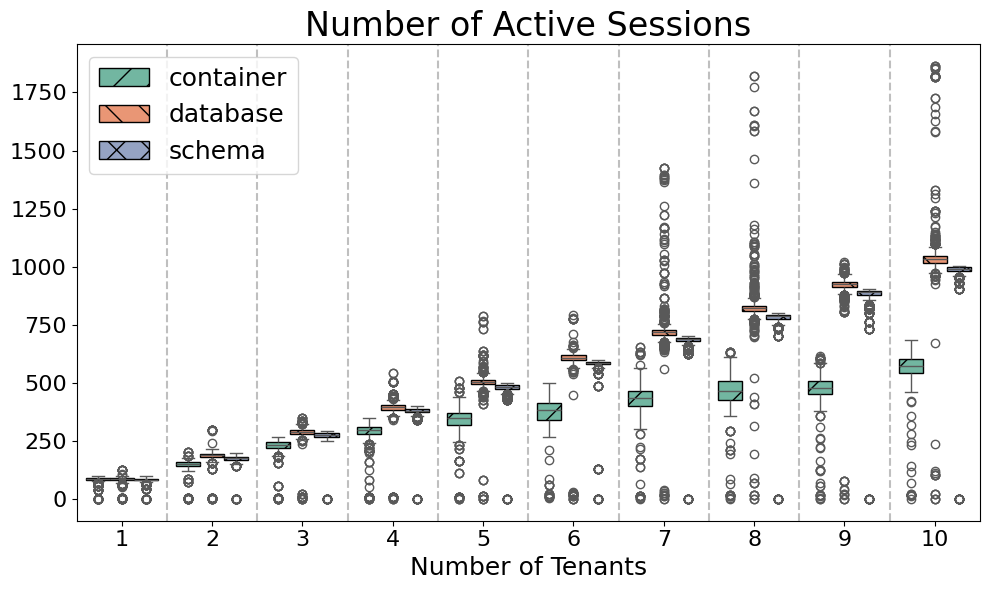

In [14]:
plot_boxplots(df_performance_second, y='value', title=collect.df_metrics.loc[metric]['title'])

# Lineplot of a Single Metric for All Experiments

## First Execution Run

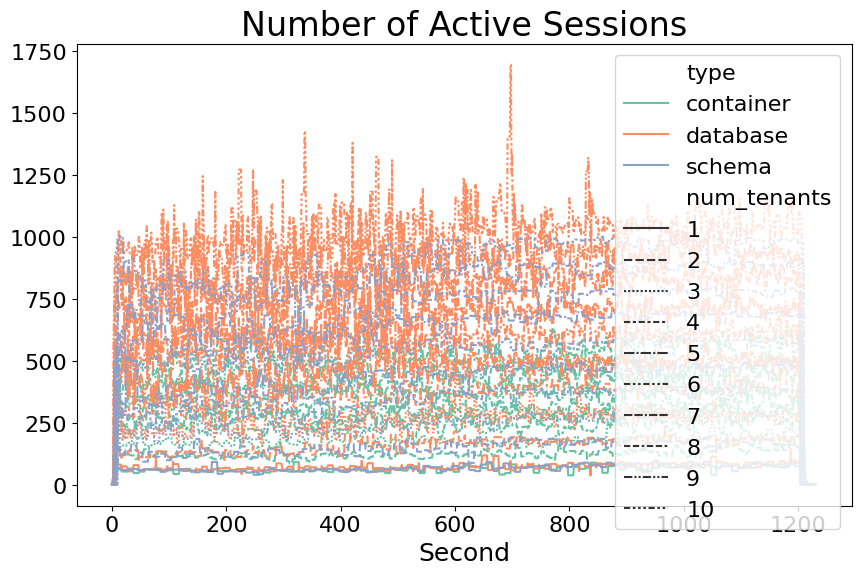

In [15]:
#df = df_performance_first[df_performance_first['type'] == 'database']
plot_lines(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

# Aggregated Data for all Clients

In [16]:
df_performance = collect.get_monitoring_single_all("stream")
df_performance

,Memory Usage [MiB],Memory Usage Cached [MiB],CPU Utilization [%],CPU Throttle [%],CPU Throttled Time [s],CPU Utilization Time [s],CPU User Time [s],CPU System Time [s],Core Utilization Variance [%],Disk Blocks Read Count,...,Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],client,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,11280.95,22646.49,23.55,0.0,0.0,29789.32,17952.80,11836.52,17.64,18.0,...,inf,592.68,9.26,0.51,8.12,16.00,1,container,1,1755830083
PostgreSQL-1-1-65536-0-2,15781.55,32937.14,17.25,0.0,0.0,21791.40,12155.61,9635.79,10.97,8.0,...,inf,699.83,10.93,1.67,26.75,16.00,2,container,1,1755830083
PostgreSQL-1-1-65536-1,11402.96,23110.41,23.22,0.0,0.0,28941.37,17661.82,11279.54,17.04,21.0,...,inf,617.94,9.66,0.52,8.40,16.00,1,database,1,1755827075
PostgreSQL-1-1-65536-2,15934.91,33764.31,17.58,0.0,0.0,21634.30,11848.33,9785.97,11.93,2.0,...,inf,732.90,11.45,1.69,27.00,16.00,2,database,1,1755827075
PostgreSQL-1-1-65536-1,11219.34,22631.66,23.21,0.0,0.0,28931.11,17888.80,11042.31,17.24,17.0,...,inf,598.33,9.35,0.52,8.38,16.00,1,schema,1,1755824080
PostgreSQL-1-1-65536-2,15876.78,33526.33,18.18,0.0,0.0,22085.45,12531.03,9554.42,12.23,3.0,...,inf,715.91,11.19,1.71,27.39,16.00,2,schema,1,1755824080
PostgreSQL-1-1-65536-0-1,10325.05,19290.16,18.46,0.0,0.0,22695.83,14650.90,8044.93,37.29,30.0,...,inf,446.40,6.98,0.38,6.03,16.00,1,container,2,1755839262
PostgreSQL-1-1-65536-0-2,14503.24,28966.03,15.62,0.0,0.0,19894.05,11730.22,8163.83,26.44,8.0,...,inf,567.00,8.86,0.00,0.00,16.00,2,container,2,1755839262
PostgreSQL-1-1-65536-1-1,10212.61,18581.94,18.17,0.0,0.0,22477.65,14526.87,7950.78,37.27,22.0,...,inf,429.84,6.72,0.36,5.72,16.00,1,container,2,1755839262
PostgreSQL-1-1-65536-1-2,14386.59,28298.45,15.54,0.0,0.0,19665.70,11674.06,7991.63,26.41,5.0,...,inf,543.00,8.48,0.00,0.00,16.00,2,container,2,1755839262


# Monitoring Aggregated Values

In [17]:
df_performance = collect.get_monitoring_all("stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.T#[['Max CPU', 'client', 'type', 'num_tenants']]

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],11280.95,15781.55,11402.96,15934.91,11219.34,15876.78,20537.66,28889.83,14900.05,21057.89,...,36419.48,39824.57,36174.76,38795.28,80436.5,95477.51,39534.86,42776.77,39694.94,42223.93
Memory Usage Cached [MiB],22646.49,32937.14,23110.41,33764.31,22631.66,33526.33,37872.1,57264.48,30674.66,43448.79,...,67522.16,74289.11,67169.24,72463.81,115172.57,144217.08,71672.67,78398.59,71942.53,77382.29
CPU Utilization [%],23.55,17.25,23.22,17.58,23.21,18.18,36.63,31.16,27.51,19.94,...,31.39,14.59,29.91,13.71,52.98,54.18,31.74,14.89,30.96,13.45
CPU Throttle [%],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],29789.32,21791.4,28941.37,21634.3,28931.11,22085.45,45173.48,39559.75,33912.21,24955.08,...,39074.6,18011.12,37234.18,16954.57,65845.57,68545.31,38902.47,18891.8,37885.34,16330.24
CPU User Time [s],17952.8,12155.61,17661.82,11848.33,17888.8,12531.03,29177.77,23404.28,21871.81,15296.96,...,24884.74,11149.08,23393.68,10403.85,44532.69,46598.06,24612.08,11421.95,25316.94,10096.68
CPU System Time [s],11836.52,9635.79,11279.54,9785.97,11042.31,9554.42,15995.71,16155.46,12040.4,9658.12,...,14189.86,6862.03,13840.5,6550.73,21312.89,21947.25,14290.39,7469.85,12568.41,6233.56
Core Utilization Variance [%],17.64,10.97,17.04,11.93,17.24,12.23,74.56,52.85,24.07,14.0,...,32.27,9.25,30.21,8.01,769.03,783.7,32.56,9.86,32.78,7.95


## First Execution Run

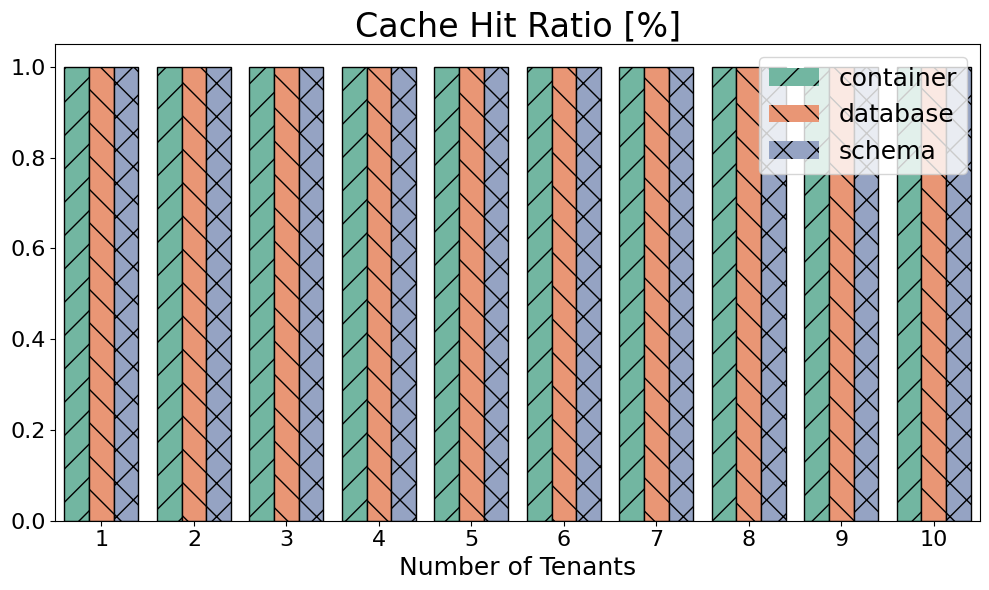

In [18]:
plot_bars(df_performance_first, y='Buffer Cache Hit Ratio', title='Cache Hit Ratio [%]', estimator='min')

## Second Execution Run

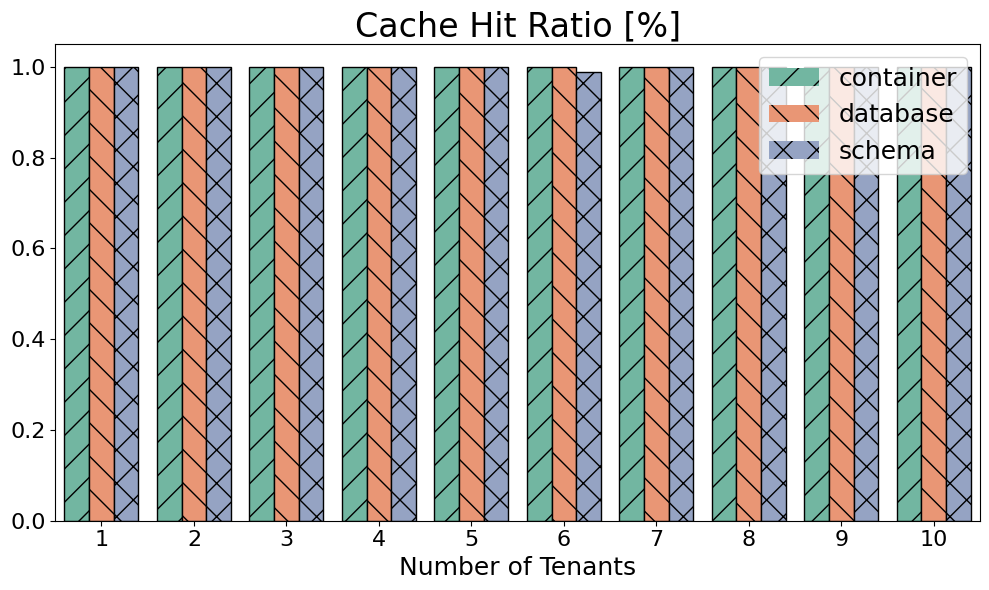

In [19]:
plot_bars(df_performance_second, y='Buffer Cache Hit Ratio', title='Cache Hit Ratio [%]', estimator='min')

# Performance Results per Tenant

In [20]:
df_performance = collect.get_performance_all_single()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,connection,configuration,experiment_run,client,pod,pod_count,bench,profile,target,time,...,Latency Distribution.Median Latency (microseconds),Latency Distribution.Minimum Latency (microseconds),Latency Distribution.25th Percentile Latency (microseconds),Latency Distribution.90th Percentile Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),Latency Distribution.75th Percentile Latency (microseconds),Latency Distribution.Average Latency (microseconds),type,num_tenants,code
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,jjrhl.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,14081,627,8789,31546,51124,22259,16880,container,1,1755830083
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,d8t6z.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,31539,705,23617,46650,60301,39317,30818,container,1,1755830083
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,shsm7.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,14234,650,8914,31544,49970,22722,17098,database,1,1755827075
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,fxqzz.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,31114,704,23196,46579,61052,39036,30583,database,1,1755827075
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,prv9l.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,14690,621,9161,31394,49229,22907,17175,schema,1,1755824080
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,js4fh.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,29388,726,21555,45225,59739,37483,29227,schema,1,1755824080
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,swqk4.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,16908,667,10672,38855,75045,26653,20890,container,2,1755839262
PostgreSQL-1-1-65536-1-1-1,PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,1,1,6wwxh.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,16866,703,10681,39727,85016,26598,21290,container,2,1755839262
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,8stmn.dbmsbenchmarker,1,tpcc,postgres,65536,1200,...,30572,737,21968,50679,77484,40162,31800,container,2,1755839262


## First Execution Run

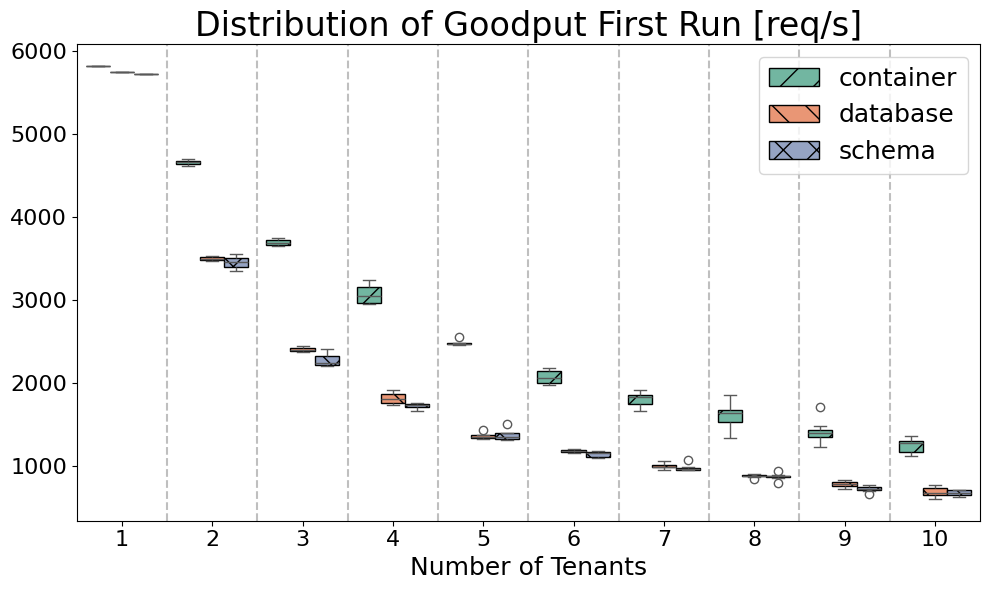

In [21]:
plot_boxplots(df_performance_first, y='Goodput (requests/second)', title='Distribution of Goodput First Run [req/s]')

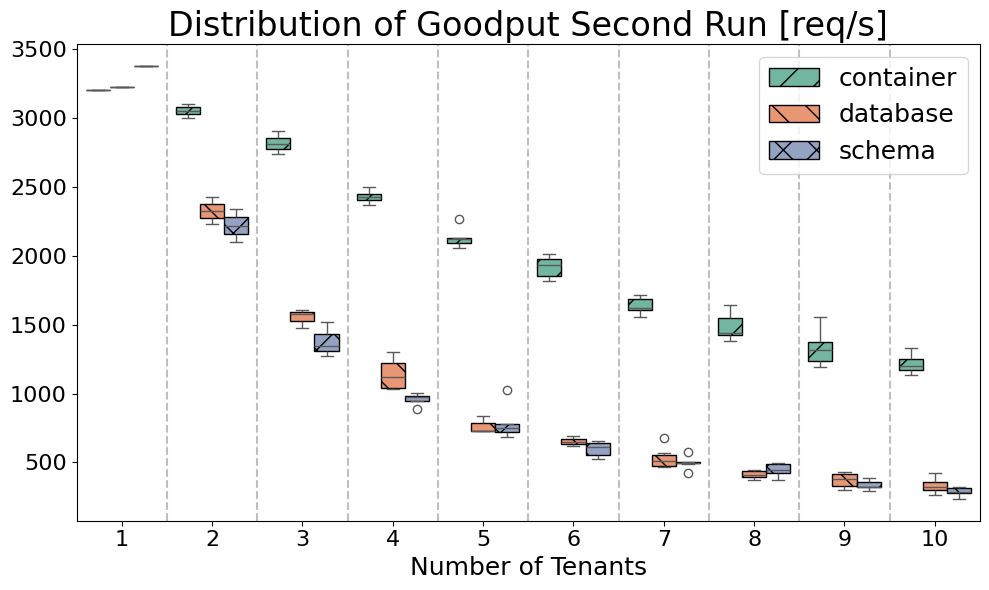

In [22]:
plot_boxplots(df_performance_second, y='Goodput (requests/second)', title='Distribution of Goodput Second Run [req/s]')

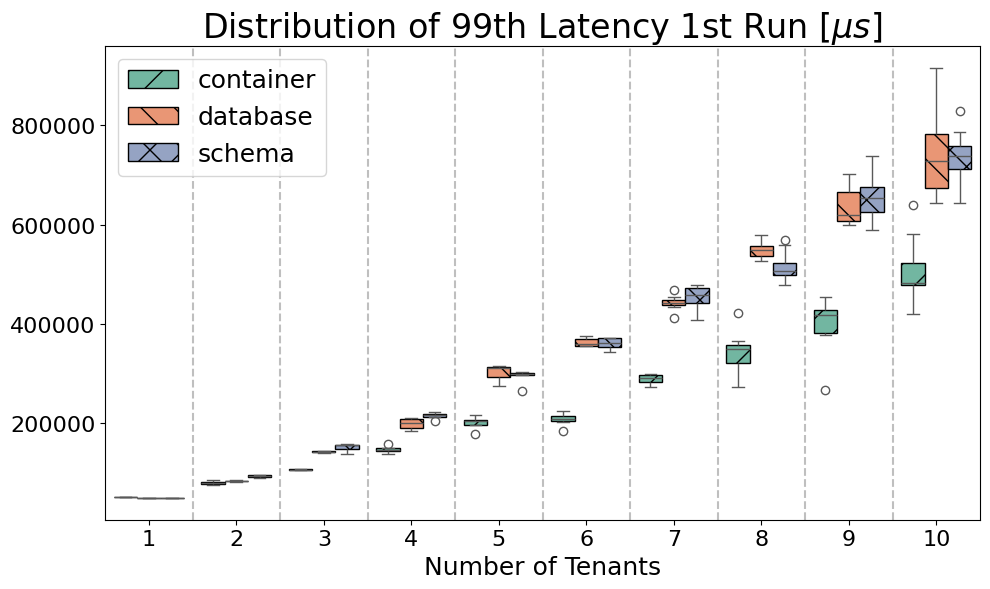

In [23]:
plot_boxplots(df_performance_first, y='Latency Distribution.99th Percentile Latency (microseconds)', title='Distribution of 99th Latency 1st Run [$\mu s$]')

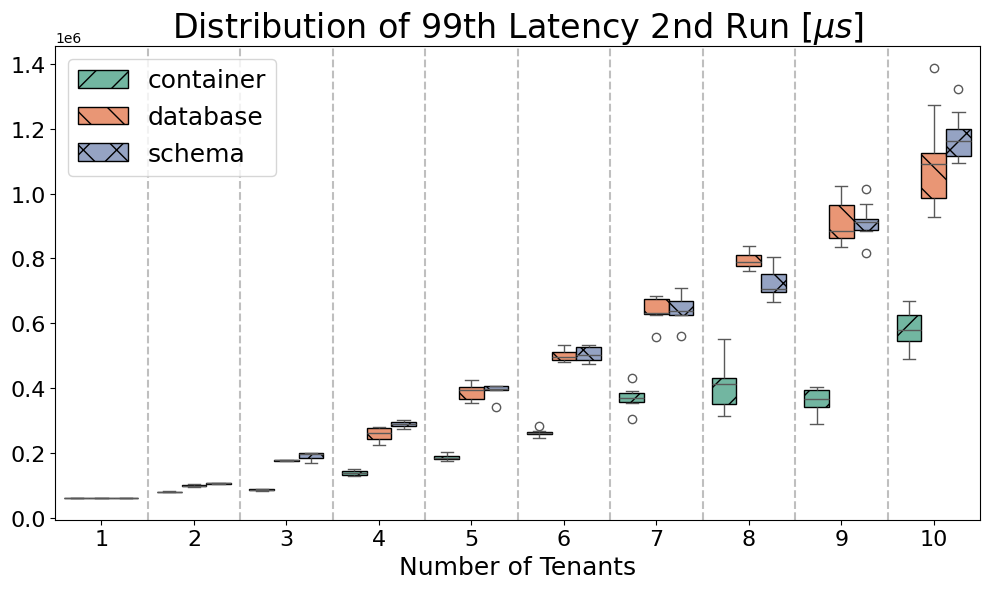

In [24]:
plot_boxplots(df_performance_second, y='Latency Distribution.99th Percentile Latency (microseconds)', title='Distribution of 99th Latency 2nd Run [$\mu s$]')

# Performance Results per Total

In [25]:
df_performance = collect.get_performance_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.dropna(inplace=True)

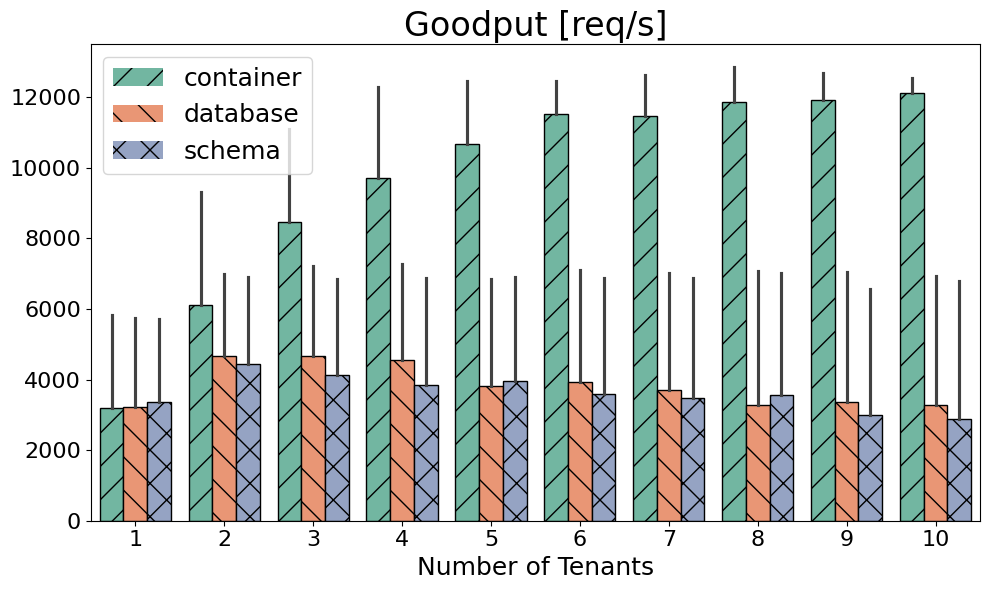

In [26]:
plot_bars(df_performance, y='Goodput (requests/second)', title='Goodput [req/s]', estimator='min')

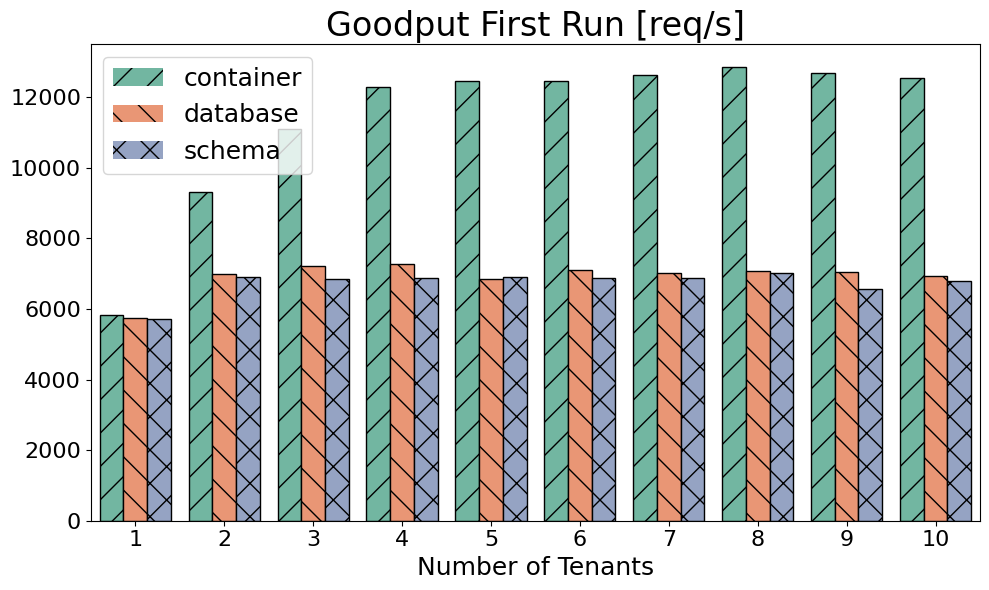

In [27]:
plot_bars(df_performance_first, y='Goodput (requests/second)', title='Goodput First Run [req/s]', estimator='min')

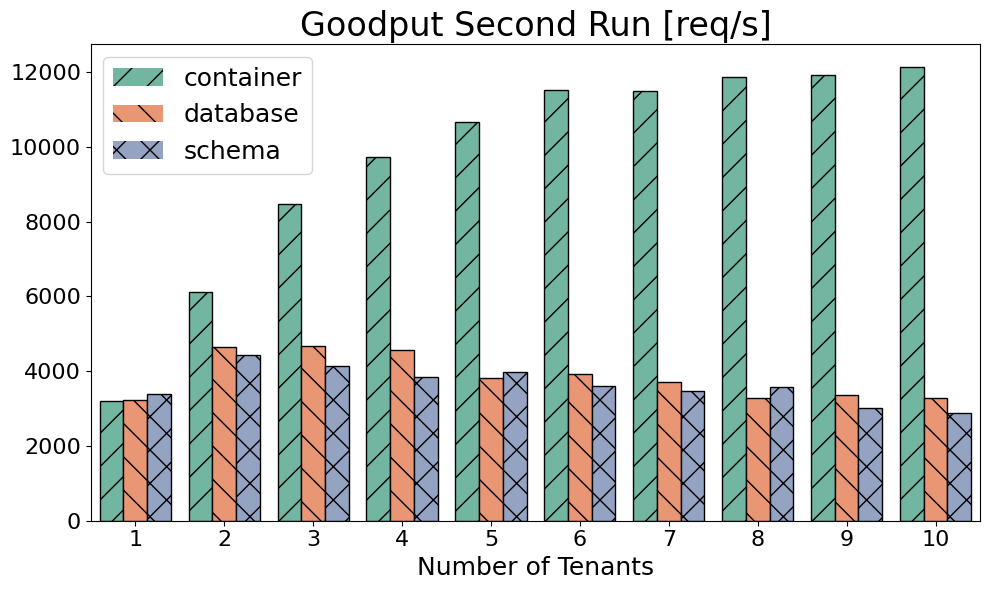

In [28]:
plot_bars(df_performance_second, y='Goodput (requests/second)', title='Goodput Second Run [req/s]', estimator='min')

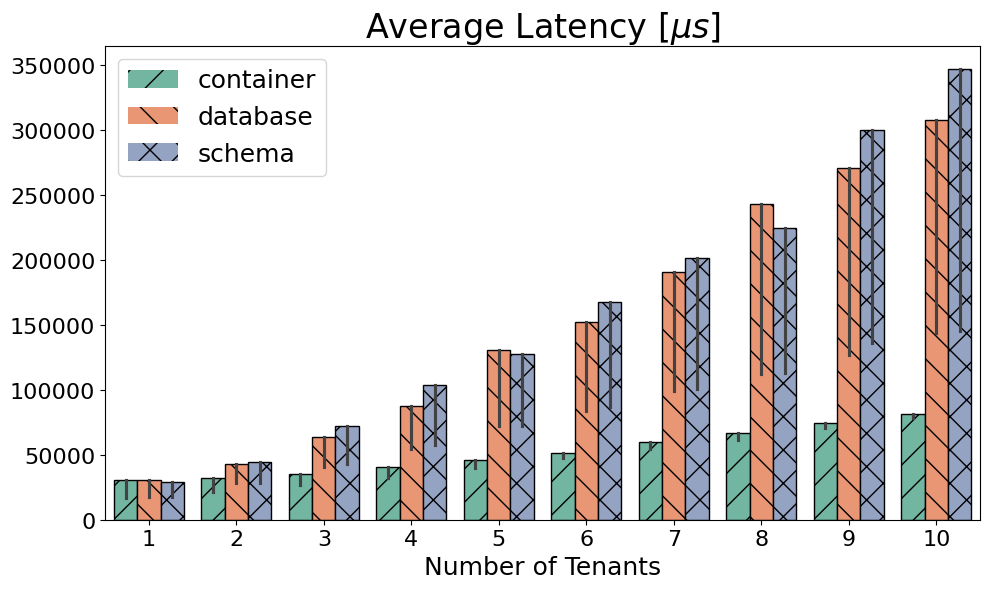

In [29]:
plot_bars(df_performance, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency [$\mu s$]', estimator='max')

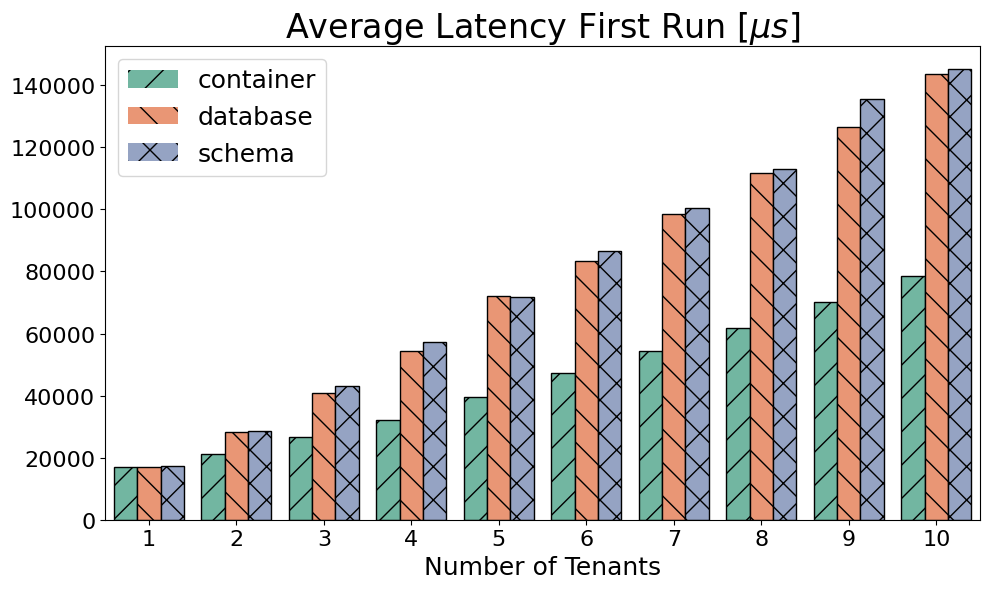

In [30]:
plot_bars(df_performance_first, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency First Run [$\mu s$]', estimator='max')

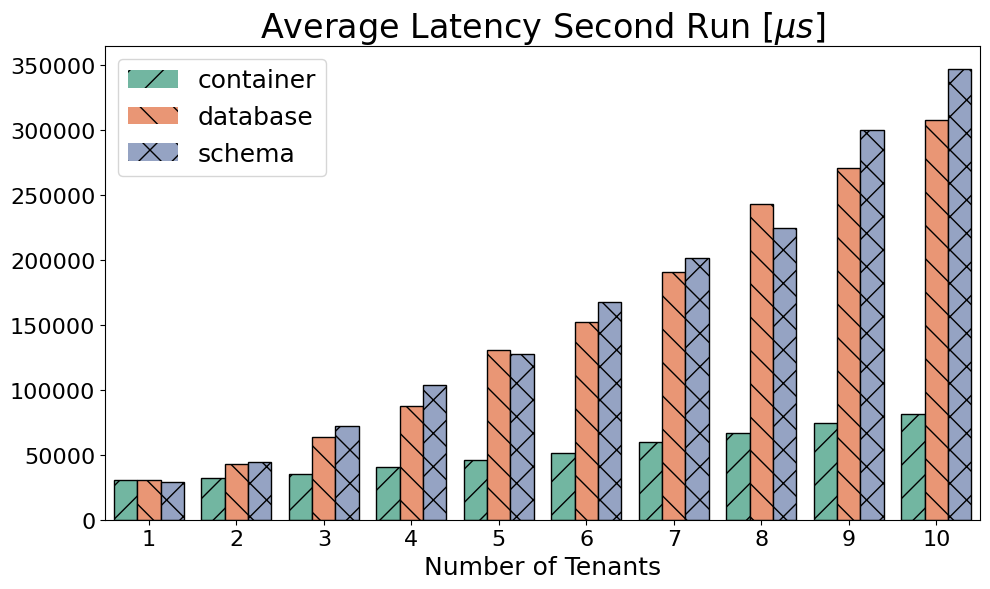

In [31]:
plot_bars(df_performance_second, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency Second Run [$\mu s$]', estimator='max')

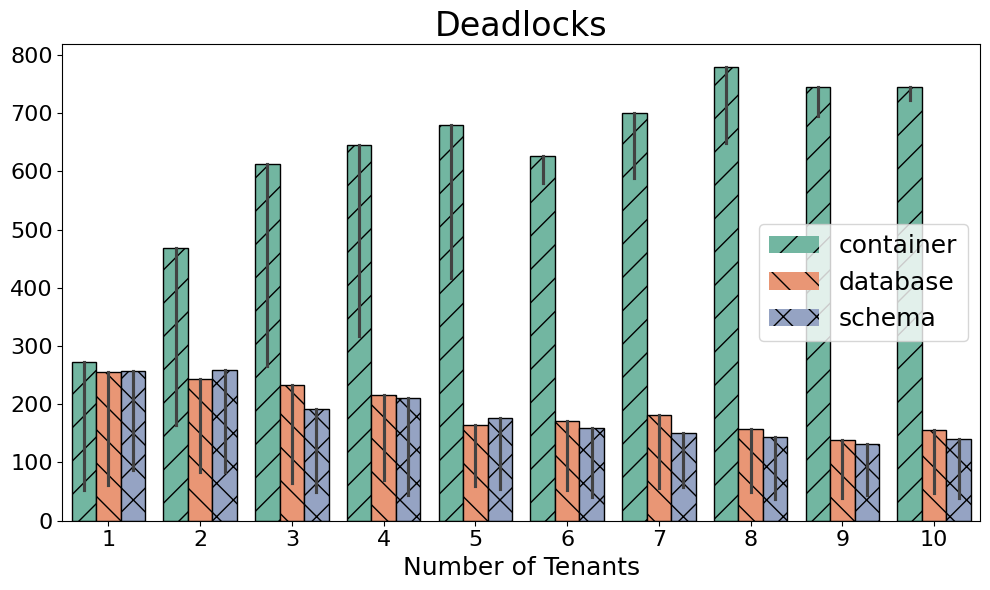

In [32]:
plot_bars(df_performance, y='num_errors', title='Deadlocks', estimator='max')

In [33]:
df_performance = collect.get_loading_time_max_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,time_load,time_ingest,time_check,terminals,pods,tenant,client,datadisk,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,268.0,103.0,163.0,1,1,0,1,2720,container,1,1755830083
PostgreSQL-1-1-65536-0-2,268.0,103.0,163.0,1,1,0,2,18671,container,1,1755830083
PostgreSQL-1-1-65536-1,227.0,93.0,132.0,1,1,,1,2727,database,1,1755827075
PostgreSQL-1-1-65536-2,227.0,93.0,132.0,1,1,,2,19255,database,1,1755827075
PostgreSQL-1-1-65536-1,222.0,90.0,130.0,1,1,,1,2719,schema,1,1755824080
PostgreSQL-1-1-65536-2,222.0,90.0,130.0,1,1,,2,18726,schema,1,1755824080
PostgreSQL-1-1-65536-0-1,306.0,120.0,185.0,1,1,0,1,2720,container,2,1755839262
PostgreSQL-1-1-65536-0-2,306.0,120.0,185.0,1,1,0,2,14919,container,2,1755839262
PostgreSQL-1-1-65536-1-1,301.0,118.0,182.0,1,1,1,1,2719,container,2,1755839262
PostgreSQL-1-1-65536-1-2,301.0,118.0,182.0,1,1,1,2,14467,container,2,1755839262


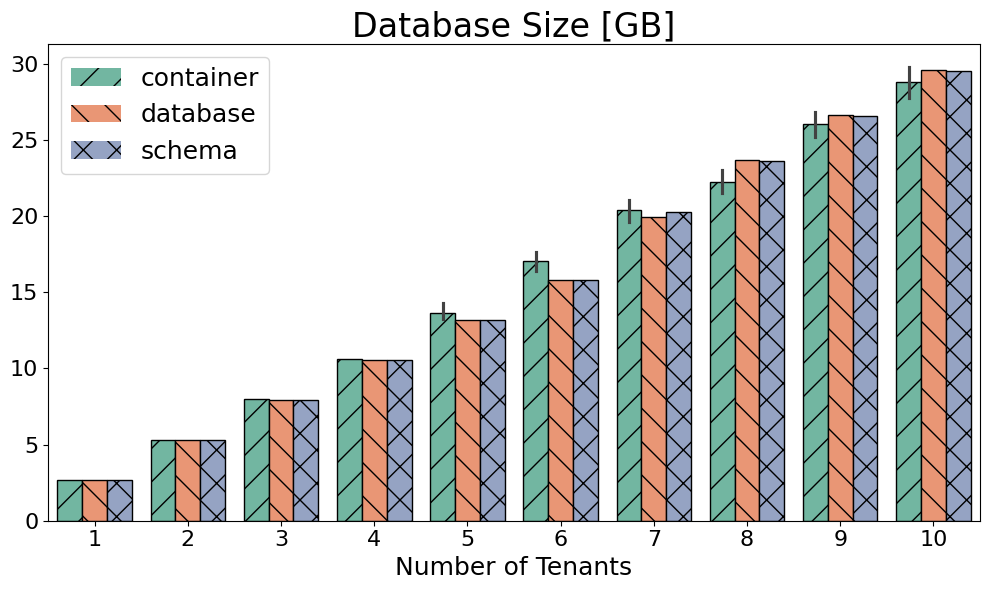

In [34]:
df_performance_first = df_performance[df_performance['client'] == '1']
# Divide datadisk by the count of rows with the same type and num_tenants
df = df_performance_first.copy()
# Create a mask for rows where type is not "container"
mask = df['type'] != 'container'

# Only apply the group count to the relevant rows
group_counts = df[mask].groupby(['type', 'num_tenants'])['datadisk'].transform('count')

# Initialize the column with NaN (or 0, if preferred)
df['datadisk_normalized'] = df['datadisk'] / 1024

# Apply the normalized value only where the mask is True
df.loc[mask, 'datadisk_normalized'] = df.loc[mask, 'datadisk'] / group_counts / 1024

plot_bars(df, y='datadisk_normalized', title='Database Size [GB]', estimator='sum')

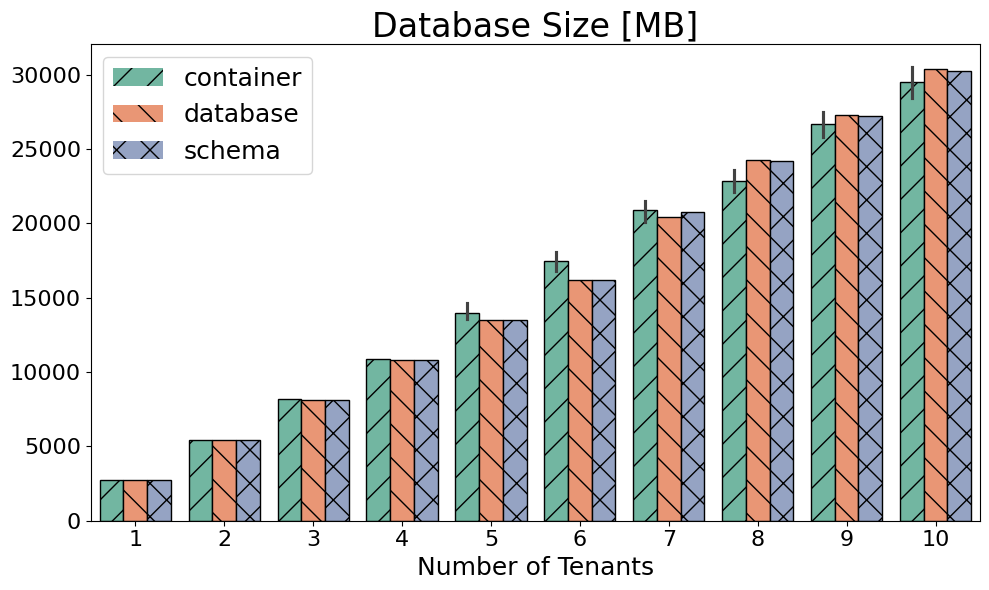

In [35]:
plot_bars(df_performance_first, y='datadisk', title='Database Size [MB]', estimator='sum')

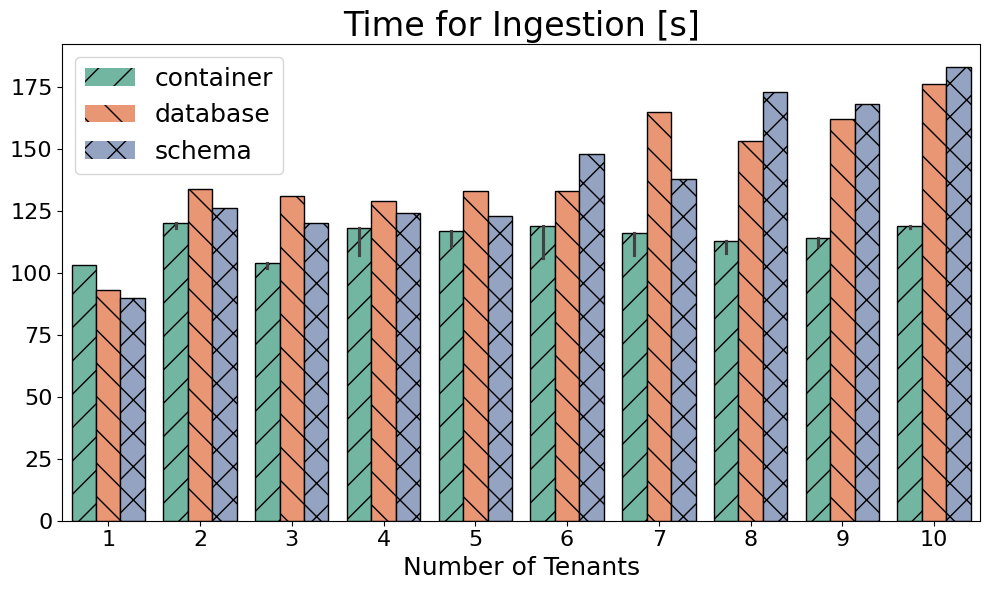

In [36]:
plot_bars(df_performance_first, y='time_ingest', title='Time for Ingestion [s]', estimator='max')

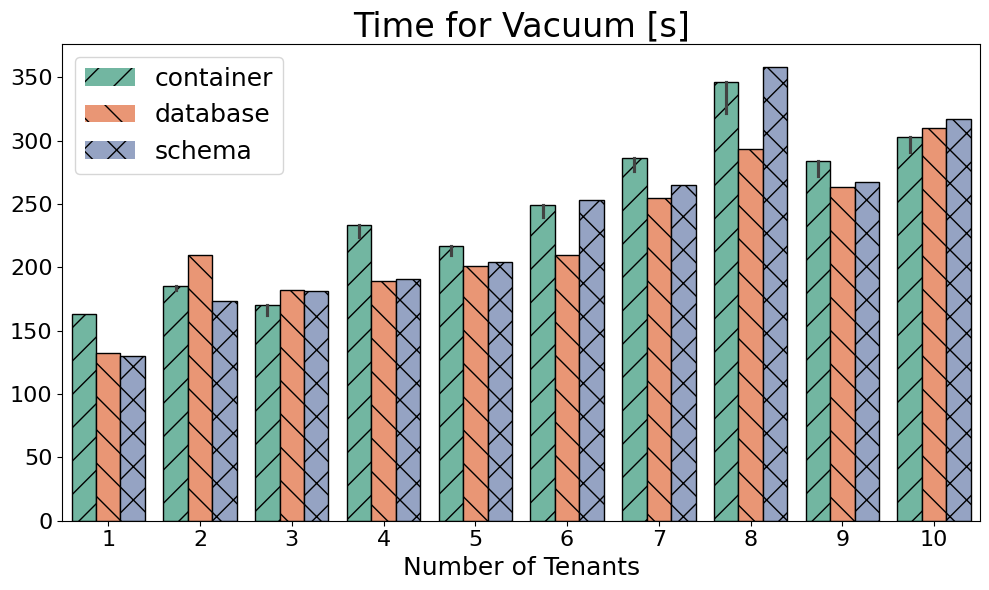

In [37]:
plot_bars(df_performance_first, y='time_check', title='Time for Vacuum [s]', estimator='max')

# Hardware Monitoring for Benchmarking Phase

In [38]:
df_performance = collect.get_monitoring_all(type="stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],11280.95,15781.55,11402.96,15934.91,11219.34,15876.78,20537.66,28889.83,14900.05,21057.89,...,36419.48,39824.57,36174.76,38795.28,80436.5,95477.51,39534.86,42776.77,39694.94,42223.93
Memory Usage Cached [MiB],22646.49,32937.14,23110.41,33764.31,22631.66,33526.33,37872.1,57264.48,30674.66,43448.79,...,67522.16,74289.11,67169.24,72463.81,115172.57,144217.08,71672.67,78398.59,71942.53,77382.29
CPU Utilization [%],23.55,17.25,23.22,17.58,23.21,18.18,36.63,31.16,27.51,19.94,...,31.39,14.59,29.91,13.71,52.98,54.18,31.74,14.89,30.96,13.45
CPU Throttle [%],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],29789.32,21791.4,28941.37,21634.3,28931.11,22085.45,45173.48,39559.75,33912.21,24955.08,...,39074.6,18011.12,37234.18,16954.57,65845.57,68545.31,38902.47,18891.8,37885.34,16330.24
CPU User Time [s],17952.8,12155.61,17661.82,11848.33,17888.8,12531.03,29177.77,23404.28,21871.81,15296.96,...,24884.74,11149.08,23393.68,10403.85,44532.69,46598.06,24612.08,11421.95,25316.94,10096.68
CPU System Time [s],11836.52,9635.79,11279.54,9785.97,11042.31,9554.42,15995.71,16155.46,12040.4,9658.12,...,14189.86,6862.03,13840.5,6550.73,21312.89,21947.25,14290.39,7469.85,12568.41,6233.56
Core Utilization Variance [%],17.64,10.97,17.04,11.93,17.24,12.23,74.56,52.85,24.07,14.0,...,32.27,9.25,30.21,8.01,769.03,783.7,32.56,9.86,32.78,7.95


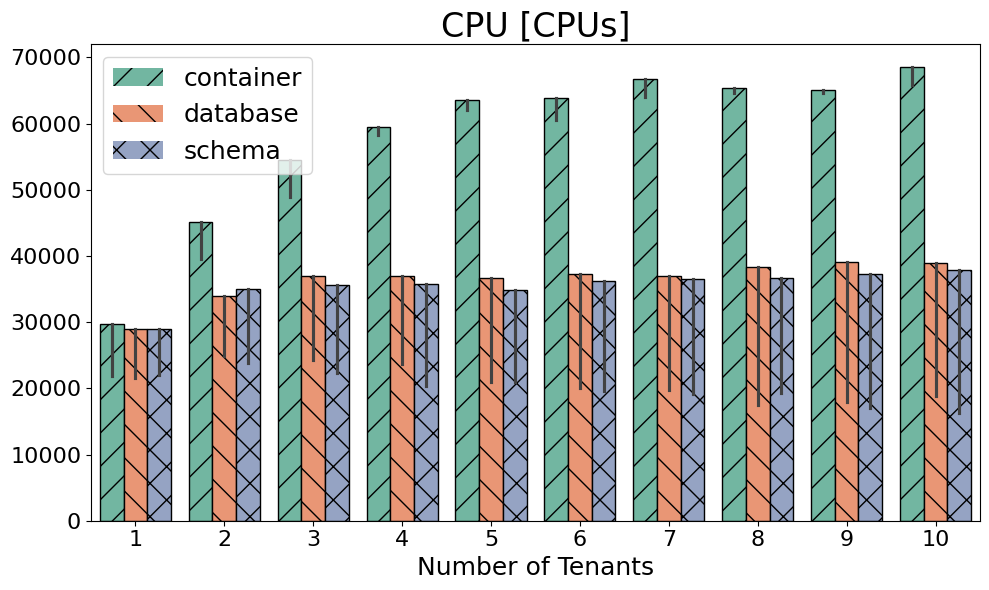

In [39]:
plot_bars(df_performance, y='CPU Utilization Time [s]', title='CPU [CPUs]', estimator='max')

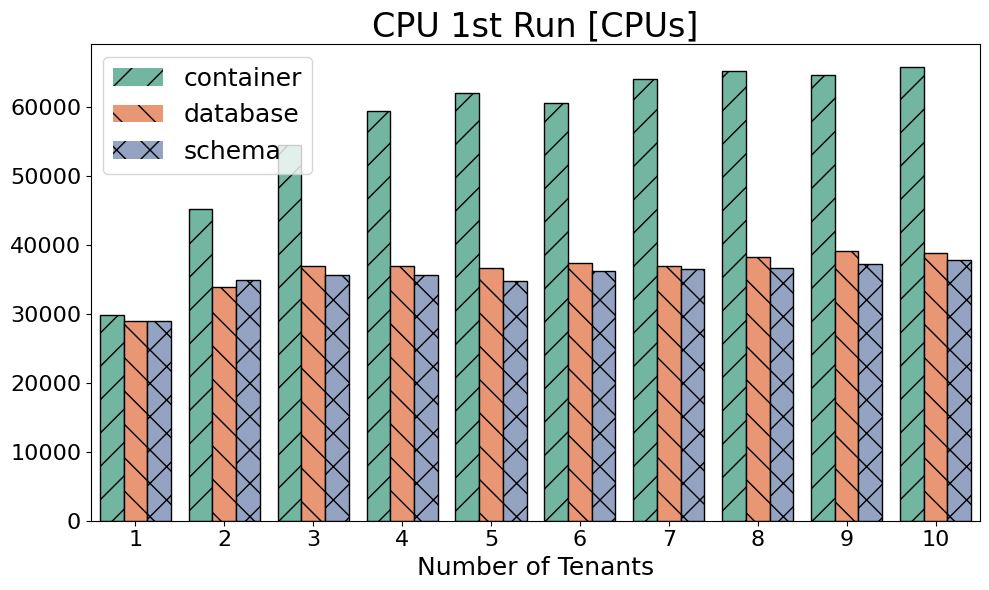

In [40]:
plot_bars(df_performance_first, y='CPU Utilization Time [s]', title='CPU 1st Run [CPUs]', estimator='max')

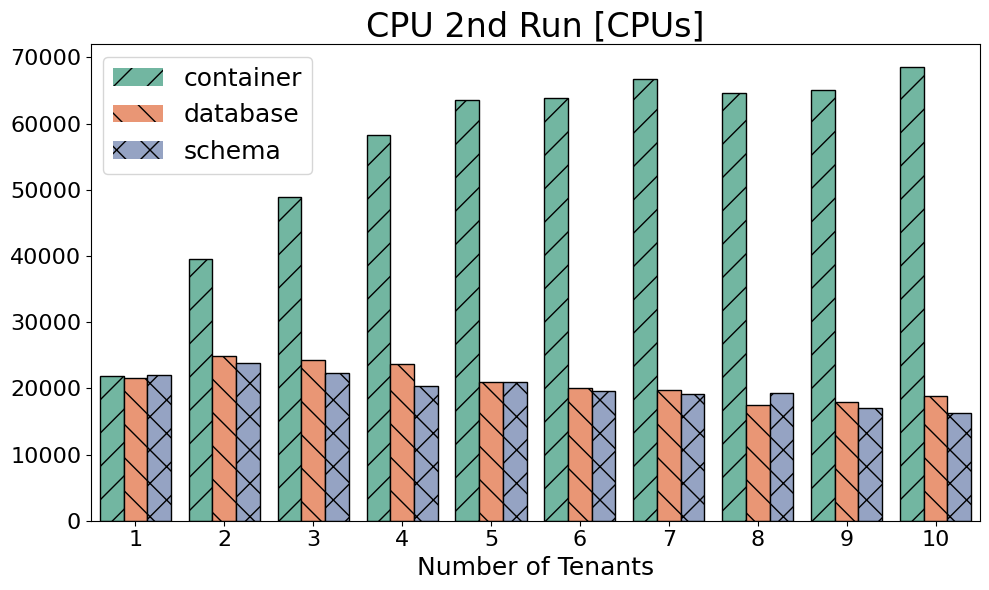

In [41]:
plot_bars(df_performance_second, y='CPU Utilization Time [s]', title='CPU 2nd Run [CPUs]', estimator='max')

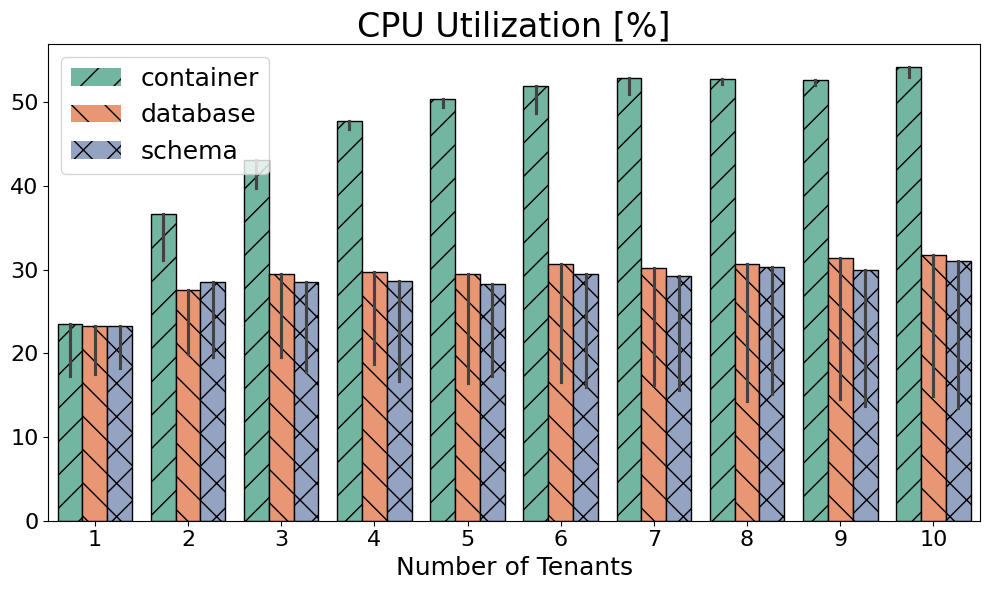

In [42]:
plot_bars(df_performance, y='CPU Utilization [%]', title='CPU Utilization [%]', estimator='max')

## Custom Aggregation

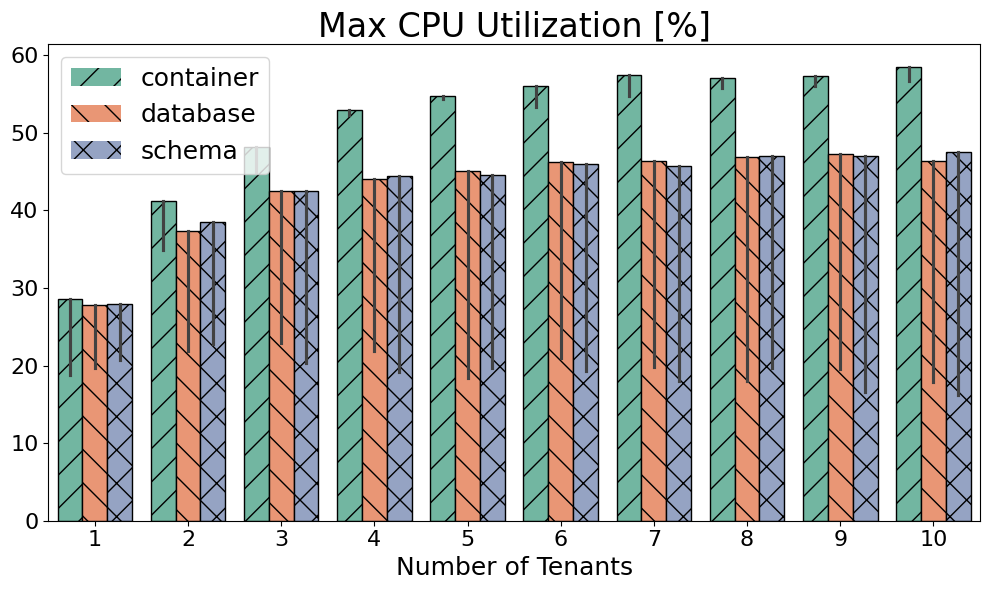

In [43]:
metric = 'total_cpu_util'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
plot_bars(df_agg, y='value', title='Max CPU Utilization [%]', estimator='max')
#df_agg

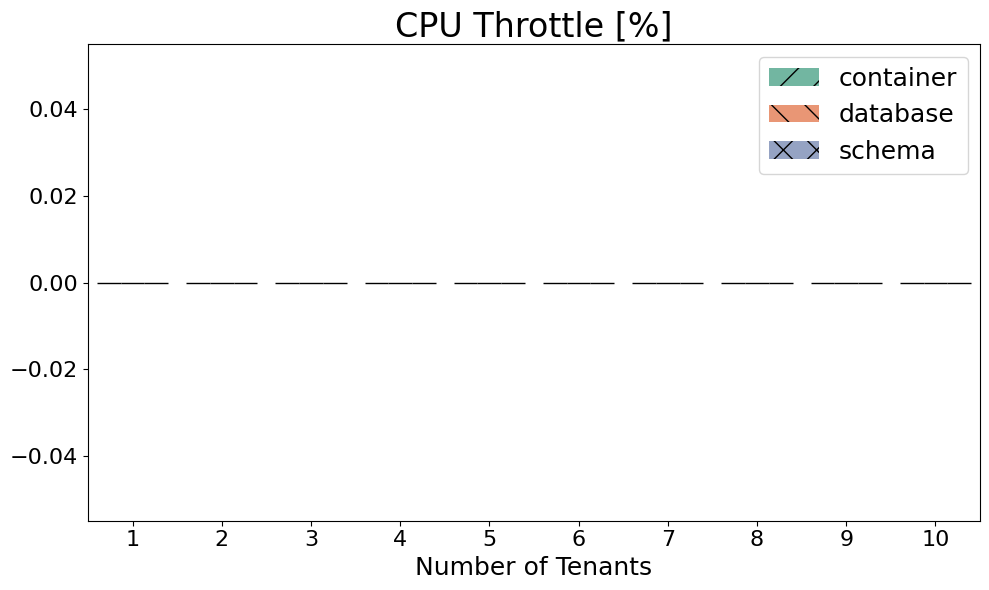

In [44]:
plot_bars(df_performance, y='CPU Throttle [%]', title='CPU Throttle [%]', estimator='max')

## Custom Aggregation and Scale

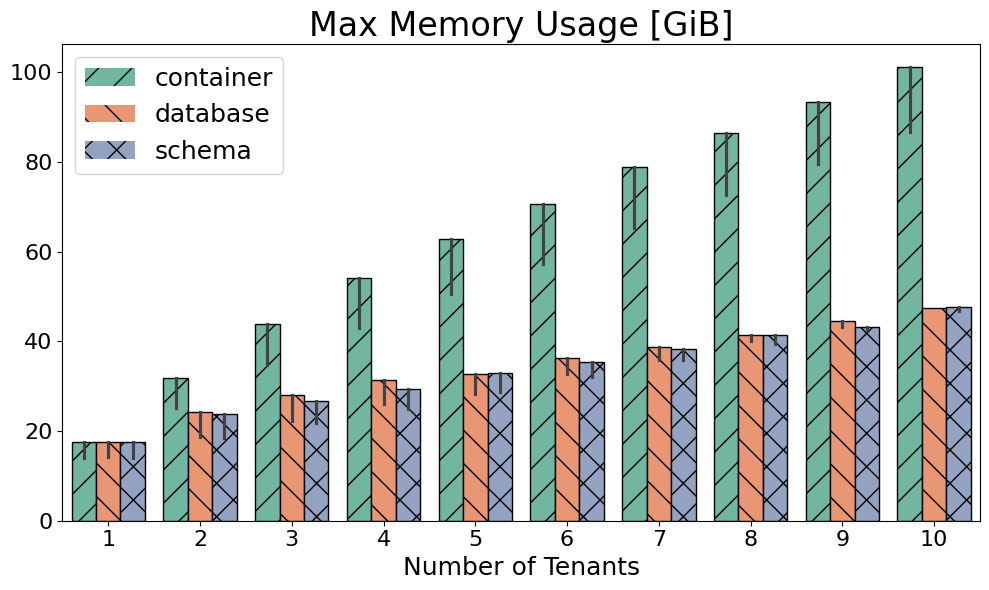

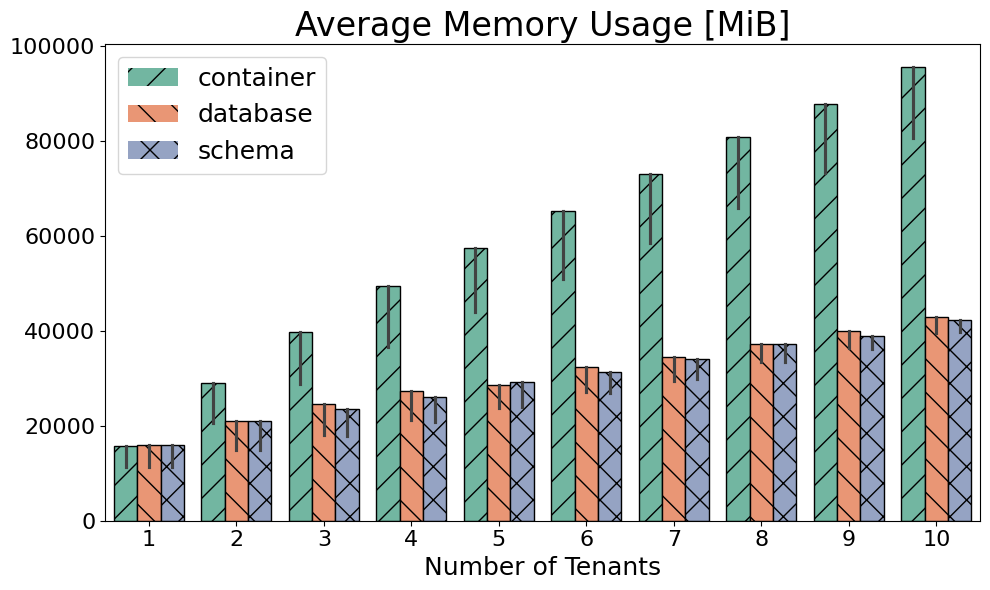

In [45]:
metric = 'total_cpu_memory'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
df_agg['value'] = df_agg['value'] / 1024.
plot_bars(df_agg, y='value', title='Max Memory Usage [GiB]', estimator='max')

plot_bars(df_performance, y='Memory Usage [MiB]', title='Average Memory Usage [MiB]', estimator='max')

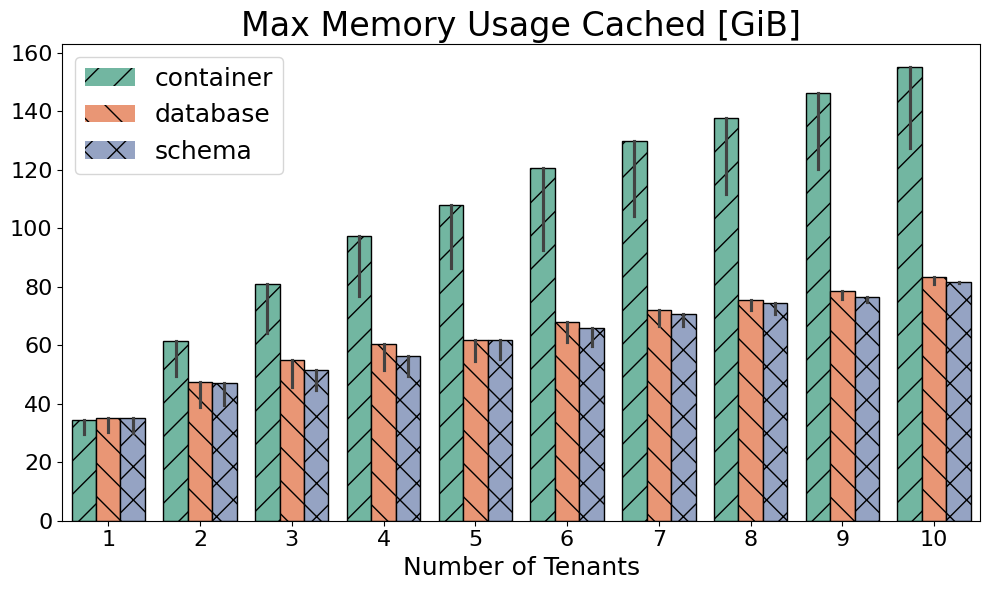

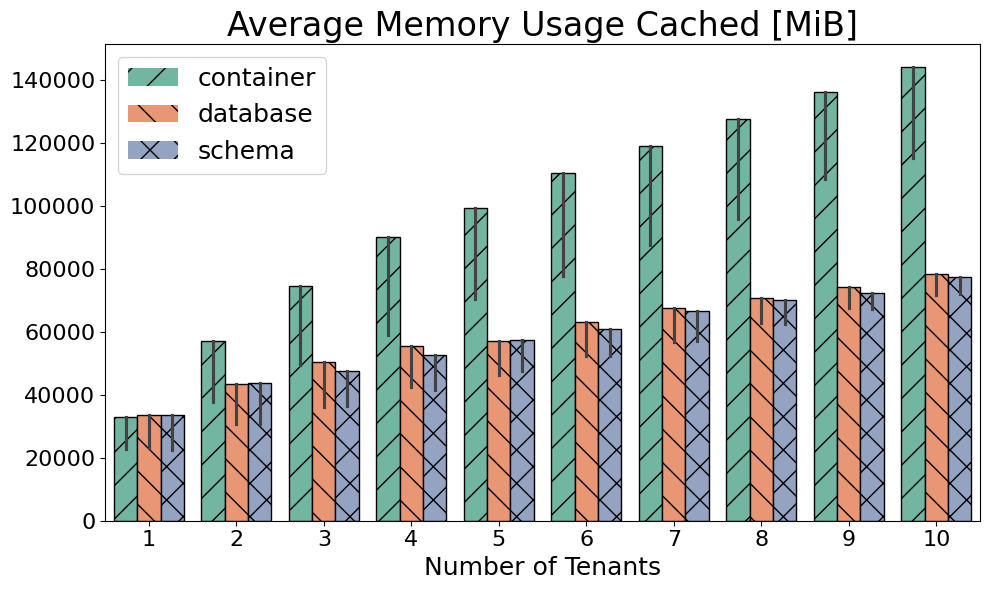

In [46]:
metric = 'total_cpu_memory_cached'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
df_agg['value'] = df_agg['value'] / 1024.
plot_bars(df_agg, y='value', title='Max Memory Usage Cached [GiB]', estimator='max')

plot_bars(df_performance, y='Memory Usage Cached [MiB]', title='Average Memory Usage Cached [MiB]', estimator='max')

# Hardware Monitoring for Loading Phase

In [47]:
df_performance = collect.get_monitoring_all("loading")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,client,Memory Usage [MiB],Memory Usage Cached [MiB],CPU Utilization [%],CPU Throttle [%],CPU Throttled Time [s],CPU Utilization Time [s],CPU User Time [s],CPU System Time [s],Core Utilization Variance [%],...,Longest Idle-in-Transaction (Aborted),Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],type,num_tenants,code
0,1,6119.34,7479.23,2.37,0.0,0.0,424.13,402.31,21.83,0.31,...,0.0,0.0,64.83,1.01,0.54,8.58,16.0,container,1,1755830083
1,2,6119.34,7479.23,2.37,0.0,0.0,424.13,402.31,21.83,0.31,...,0.0,0.0,64.83,1.01,0.54,8.58,16.0,container,1,1755830083
0,1,6019.74,7128.69,1.91,0.0,0.0,381.26,359.89,21.37,0.30,...,0.0,0.0,60.48,0.95,0.51,8.23,16.0,database,1,1755827075
1,2,6019.74,7128.69,1.91,0.0,0.0,381.26,359.89,21.37,0.30,...,0.0,0.0,60.48,0.95,0.51,8.23,16.0,database,1,1755827075
0,1,5992.14,7035.01,1.86,0.0,0.0,433.69,412.81,20.89,0.43,...,0.0,0.0,58.97,0.92,0.52,8.30,16.0,schema,1,1755824080
1,2,5992.14,7035.01,1.86,0.0,0.0,433.69,412.81,20.89,0.43,...,0.0,0.0,58.97,0.92,0.52,8.30,16.0,schema,1,1755824080
0,1,12116.65,14496.03,4.08,0.0,0.0,722.31,679.49,42.81,0.90,...,0.0,0.0,116.80,1.82,0.93,14.86,32.0,container,2,1755839262
1,2,12116.65,14496.03,4.08,0.0,0.0,722.31,679.49,42.81,0.90,...,0.0,0.0,116.80,1.82,0.93,14.86,32.0,container,2,1755839262
0,1,6763.68,9586.76,3.98,0.0,0.0,804.92,756.09,48.83,0.63,...,0.0,0.0,130.91,2.05,0.91,14.49,16.0,database,2,1755836179
1,2,6763.68,9586.76,3.98,0.0,0.0,804.92,756.09,48.83,0.63,...,0.0,0.0,130.91,2.05,0.91,14.49,16.0,database,2,1755836179


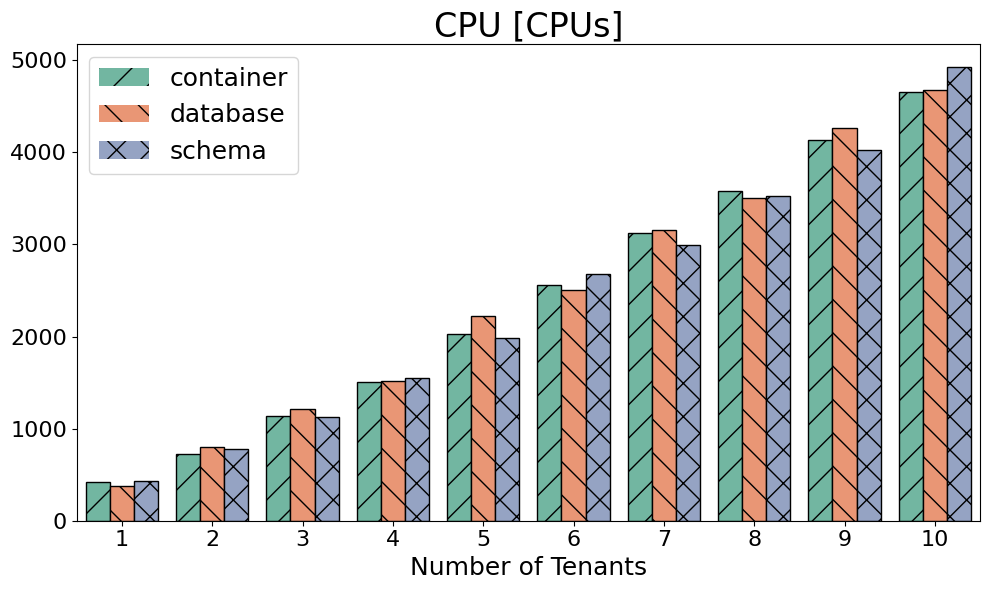

In [48]:
plot_bars(df_performance, y='CPU Utilization Time [s]', title='CPU [CPUs]', estimator='max')

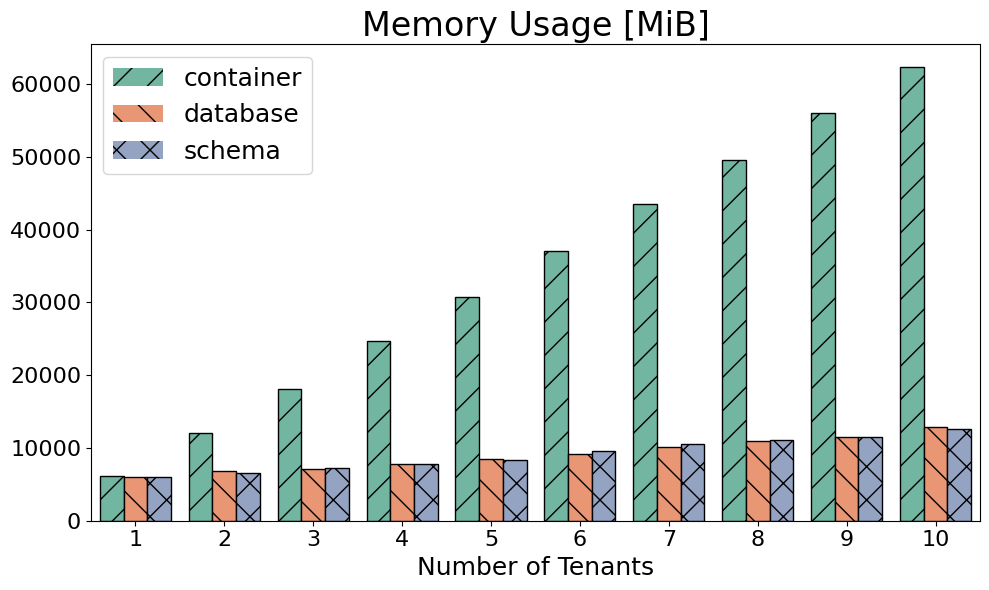

In [49]:
plot_bars(df_performance, y='Memory Usage [MiB]', title='Memory Usage [MiB]', estimator='max')

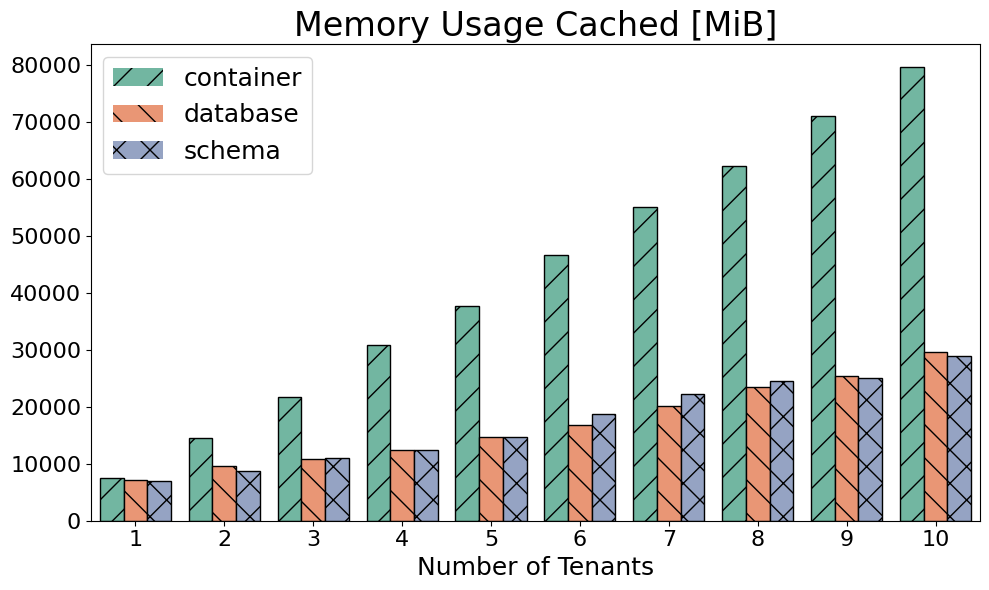

In [50]:
plot_bars(df_performance, y='Memory Usage Cached [MiB]', title='Memory Usage Cached [MiB]', estimator='max')

# Efficiency

In [51]:
client = '1'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['I_Lat'] = 1./merged_df['E_Lat']
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU Utilization Time [s]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU Utilization Time [s]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Memory Usage [MiB]']
merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,Memory Usage [MiB],Memory Usage Cached [MiB],...,Longest Idle-in-Transaction (Aborted),Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],E_Tpx,E_Lat,E_RAM
0,1,5824.252420,273,16880.000000,51124,container,1,1755830083,11280.95,22646.49,...,0.0,inf,592.68,9.26,0.51,8.12,16.0,117.308869,0.044595,0.516291
1,1,5753.012490,256,17098.000000,49970,database,1,1755827075,11402.96,23110.41,...,0.0,inf,617.94,9.66,0.52,8.40,16.0,119.268974,0.044954,0.504519
2,1,5726.035709,257,17175.000000,49229,schema,1,1755824080,11219.34,22631.66,...,0.0,inf,598.33,9.35,0.52,8.38,16.0,118.751801,0.044861,0.510372
3,1,9322.697933,469,21090.000000,85016,container,2,1755839262,20537.66,37872.10,...,0.0,inf,876.24,13.70,0.74,11.75,32.0,123.825279,0.032398,0.453932
4,1,7005.711407,244,28140.000000,85212,database,2,1755836179,14900.05,30674.66,...,0.0,inf,788.11,12.31,0.56,8.93,16.0,123.950248,0.032371,0.470180
5,1,6912.996525,258,28532.500000,96519,schema,2,1755833116,14900.29,30886.98,...,0.0,inf,814.02,12.72,1.15,18.48,16.0,118.512609,0.031645,0.463950
6,1,11099.989650,613,26561.666667,109003,container,3,1755848595,28695.41,49454.12,...,0.0,inf,1064.23,16.63,0.84,13.50,48.0,122.189771,0.026282,0.386821
7,1,7232.711608,233,40918.666667,144480,database,3,1755845535,17961.70,36274.56,...,0.0,inf,910.58,14.23,4.22,67.49,16.0,117.244088,0.025696,0.402674
8,1,6865.286529,191,43183.666667,158108,schema,3,1755842485,17898.41,36378.50,...,0.0,inf,922.57,14.42,1.28,20.53,16.0,115.575171,0.025490,0.383570
9,1,12297.240292,645,31992.750000,158523,container,4,1755858160,36517.37,58916.34,...,0.0,inf,1197.79,18.72,0.90,14.38,64.0,124.019750,0.022921,0.336750


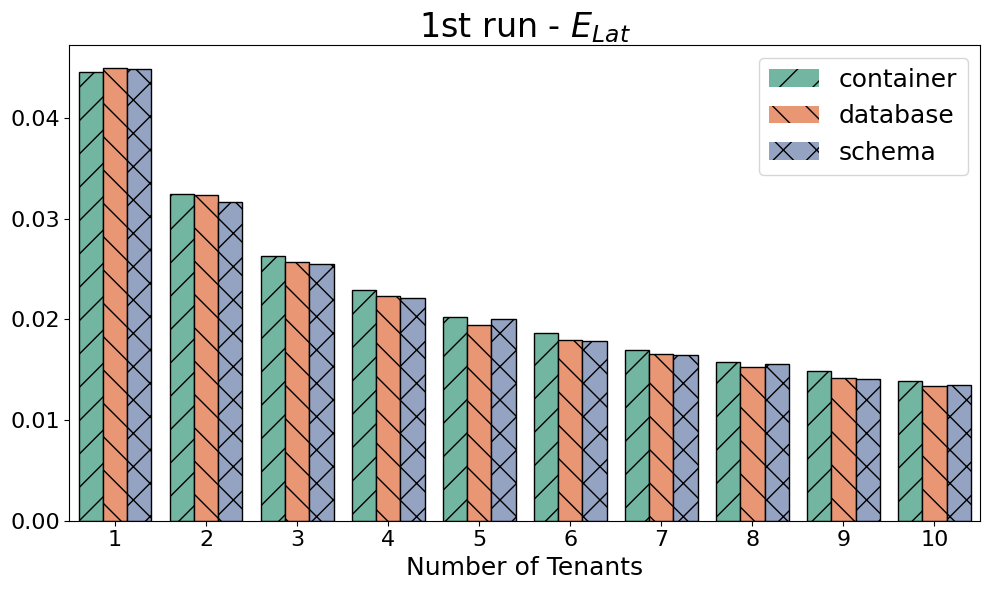

In [52]:
plot_bars(merged_df, y='E_Lat', title='1st run - $E_{Lat}$', estimator='max')

In [53]:
#plot_bars(merged_df, y='I_Lat', title='1st run - $I_{Lat}$', estimator='max')

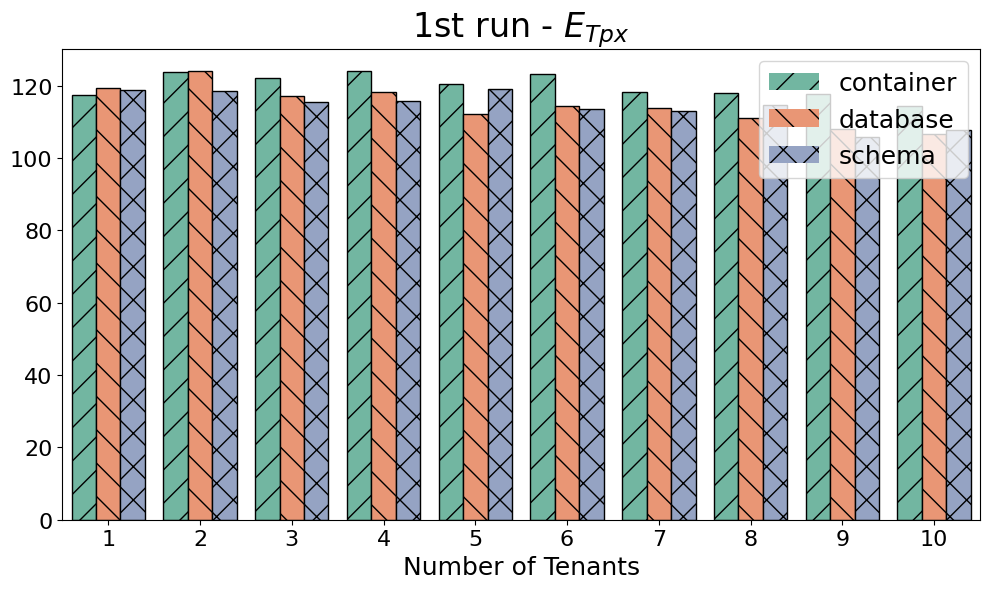

In [54]:
plot_bars(merged_df, y='E_Tpx', title='1st run - $E_{Tpx}$', estimator='max')

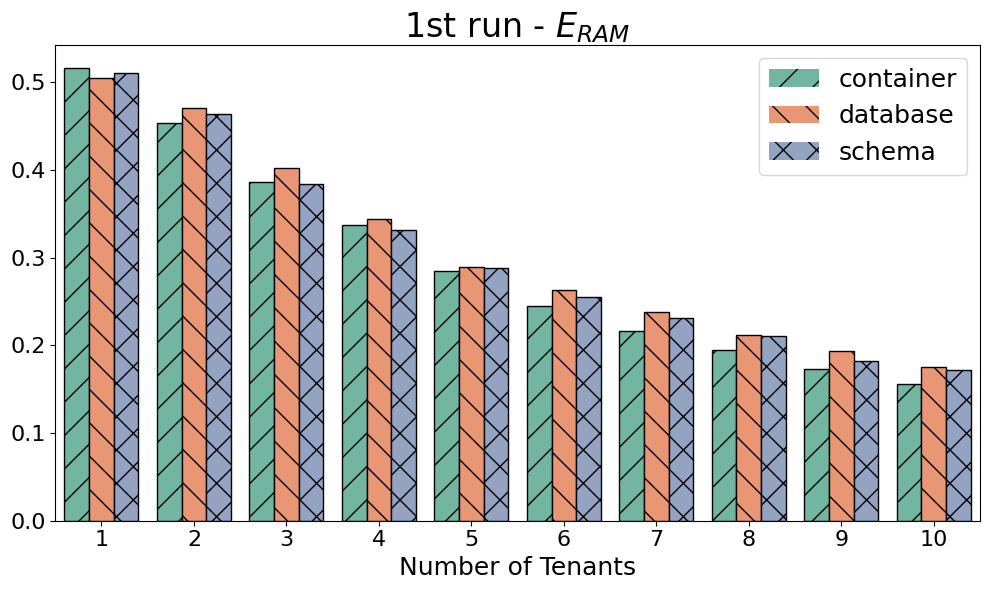

In [55]:
plot_bars(merged_df, y='E_RAM', title='1st run - $E_{RAM}$', estimator='min')

In [56]:
client = '2'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['CPUs/Request'] = merged_df['CPU [CPUs]'] / merged_df['Goodput (requests/second)'] / 600.
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU Utilization Time [s]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU Utilization Time [s]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Memory Usage [MiB]']

merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,Memory Usage [MiB],Memory Usage Cached [MiB],...,Longest Idle-in-Transaction (Aborted),Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],E_Tpx,E_Lat,E_RAM
0,2,3206.669955,53,30818.000000,60301,container,1,1755830083,15781.55,32937.14,...,0.0,inf,699.83,10.93,1.67,26.75,16.00,88.291802,0.038588,0.203191
1,2,3229.127498,61,30583.000000,61052,database,1,1755827075,15934.91,33764.31,...,0.0,inf,732.90,11.45,1.69,27.00,16.00,89.555775,0.038877,0.202645
2,2,3378.865639,87,29227.000000,59739,schema,1,1755824080,15876.78,33526.33,...,0.0,inf,715.91,11.19,1.71,27.39,16.00,91.794343,0.039360,0.212818
3,2,6105.053922,164,32329.000000,80872,container,2,1755839262,28889.83,57264.48,...,0.0,inf,1110.00,17.34,0.00,0.00,32.00,92.594932,0.027963,0.211322
4,2,4655.449692,83,42598.500000,102033,database,2,1755836179,21057.89,43448.79,...,0.0,inf,914.46,14.29,0.70,11.17,16.00,111.931912,0.030671,0.221079
5,2,4436.922370,84,44731.500000,107497,schema,2,1755833116,20955.43,43631.34,...,0.0,inf,930.81,14.54,2.25,35.96,16.00,111.456611,0.030594,0.211731
6,2,8457.008000,265,35017.333333,89066,container,3,1755848595,39801.30,74691.69,...,0.0,inf,1346.00,21.03,0.00,0.00,48.00,103.886449,0.024180,0.212481
7,2,4659.233148,65,63879.000000,177172,database,3,1755845535,24539.90,50422.00,...,0.0,inf,1050.35,16.41,3.49,55.92,16.00,114.937600,0.025370,0.189864
8,2,4135.845751,50,72288.000000,198986,schema,3,1755842485,23496.91,47746.49,...,0.0,inf,1015.79,15.87,2.44,39.06,16.00,110.888610,0.024863,0.176017
9,2,9720.439795,317,40562.500000,150105,container,4,1755858160,49333.36,90281.84,...,0.0,inf,1551.60,24.25,0.58,9.36,64.00,99.997683,0.020560,0.197036


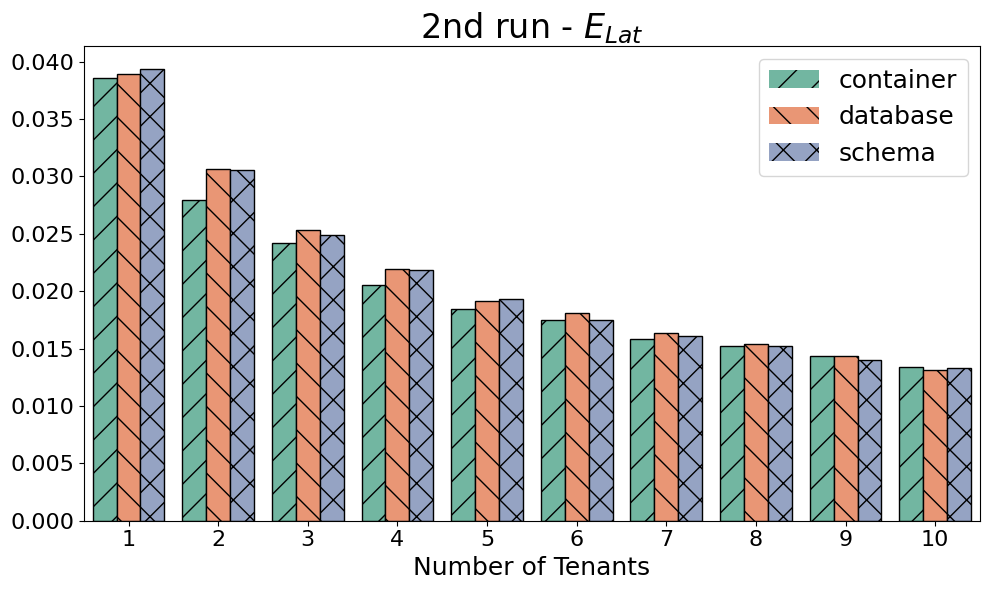

In [57]:
plot_bars(merged_df, y='E_Lat', title='2nd run - $E_{Lat}$', estimator='max')

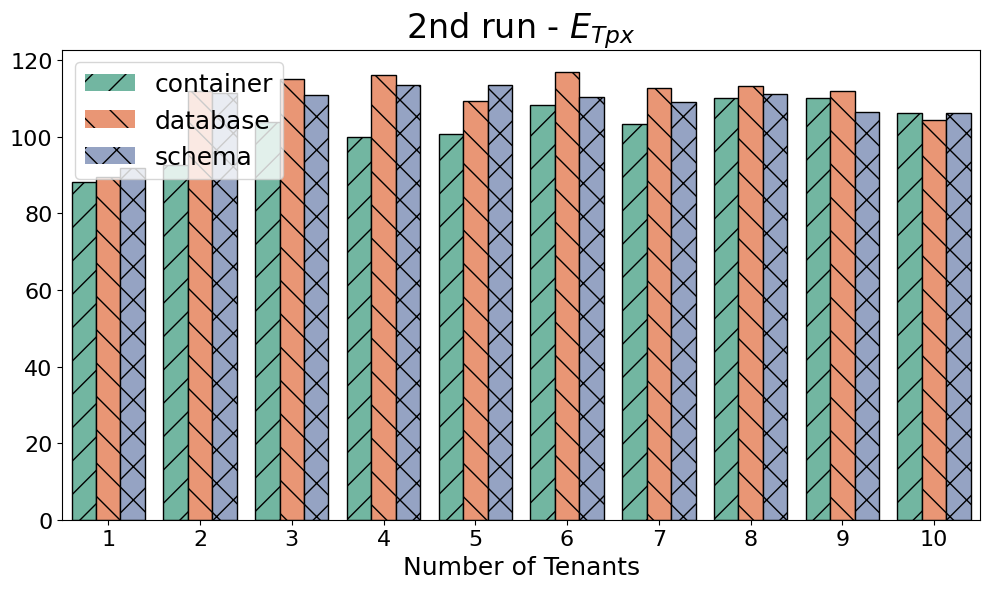

In [58]:
plot_bars(merged_df, y='E_Tpx', title='2nd run - $E_{Tpx}$', estimator='max')

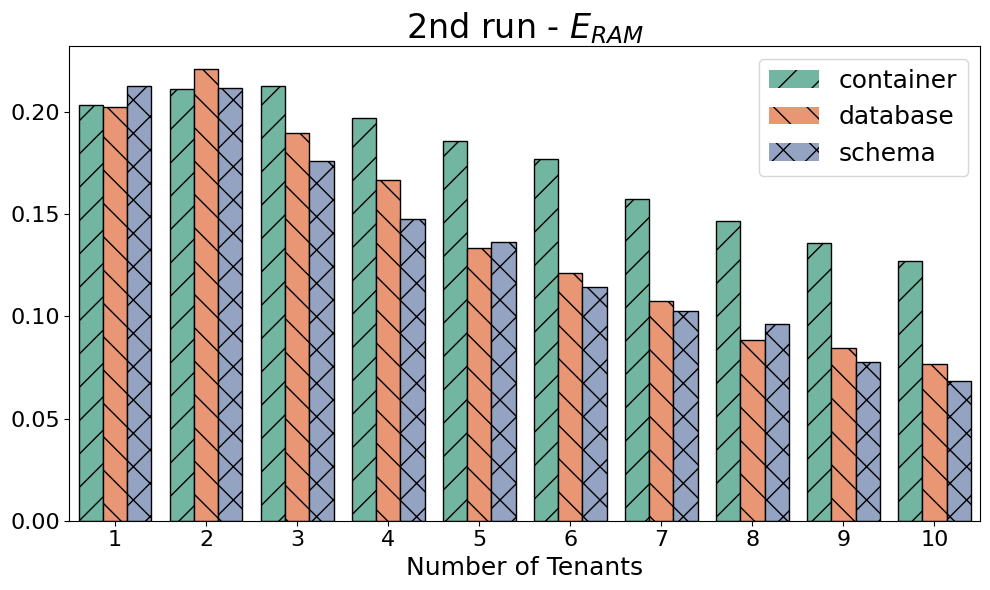

In [59]:
plot_bars(merged_df, y='E_RAM', title='2nd run - $E_{RAM}$', estimator='max')

In [60]:
import os
import zipfile

def zip_all_results():
    # Set the base directory containing the folders
    base_dir = path # "/path/to/your/folders"  # CHANGE THIS to your actual directory
    # List all folder names in the directory
    folder_names = codes
    # Create a zip for each folder
    for folder in folder_names:
        folder_path = os.path.join(base_dir, folder)
        zip_path = os.path.join(base_dir, f"{folder}.zip")
        print(f"Zipping {folder_path} to {zip_path}...")
        with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files in os.walk(folder_path):
                for file in files:
                    abs_path = os.path.join(root, file)
                    rel_path = os.path.relpath(abs_path, folder_path)
                    zipf.write(abs_path, arcname=os.path.join(folder, rel_path))
    print("✅ Done zipping all folders.")


In [61]:
#zip_all_results()